In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/bangladesh-crime-data-from-2010-2019/crime_data_bangladesh.csv


In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
plt.style.use('https://github.com/dhaitz/matplotlib-stylesheets/raw/master/pitayasmoothie-dark.mplstyle')
import plotly.express as px
import plotly.graph_objects as go
from plotly import tools
from plotly.subplots import make_subplots
from plotly.offline import iplot, init_notebook_mode
init_notebook_mode()
import warnings
warnings.filterwarnings('ignore') 
from wordcloud import WordCloud, STOPWORDS

# Data Loading

In [3]:
df=pd.read_csv('/kaggle/input/bangladesh-crime-data-from-2010-2019/crime_data_bangladesh.csv')

In [4]:
df

,area_name,year,dacoity,robbery,murder,speedy_trial,riot,woman_child_Repression,kidnapping,police_assault,burglary,theft,other_cases,recovery_cases_arms_act,recovery_cases_explosive,recovery_cases_narcotics,recovery_cases_smuggling
0,dhaka metropolitan,2010,47,220,245,363,3,1370,139,155,555,1915,7228,518,82,10535,144
1,chittagong metropolitan,2010,16,108,94,31,7,455,37,31,123,314,1831,51,0,866,99
2,khulna metropolitan,2010,3,9,29,25,0,153,11,4,65,91,551,19,2,792,13
3,rajshahi metropolitan,2010,4,20,21,9,15,157,9,12,53,106,578,3,4,332,248
4,barisal metropolitan,2010,8,12,19,21,0,112,6,8,24,83,557,17,0,155,117
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
141,rajshahi division,2019,5,8,29,6,0,99,8,2,5,40,469,25,15,1166,134
142,rangpur division,2019,1,2,33,0,0,116,0,0,8,38,625,4,0,551,94
143,railway range,2019,0,1,2,0,0,0,0,0,0,5,9,0,0,55,12
144,gazipur metropolitan,2019,2,3,3,1,0,22,1,2,2,8,65,3,0,130,2


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 146 entries, 0 to 145
Data columns (total 17 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   area_name                 146 non-null    object
 1   year                      146 non-null    int64 
 2   dacoity                   146 non-null    int64 
 3   robbery                   146 non-null    int64 
 4   murder                    146 non-null    int64 
 5   speedy_trial              146 non-null    int64 
 6   riot                      146 non-null    int64 
 7   woman_child_Repression    146 non-null    int64 
 8   kidnapping                146 non-null    int64 
 9   police_assault            146 non-null    int64 
 10  burglary                  146 non-null    int64 
 11  theft                     146 non-null    int64 
 12  other_cases               146 non-null    int64 
 13  recovery_cases_arms_act   146 non-null    int64 
 14  recovery_cases_explosive  

In [6]:
df.isna().sum()

area_name                   0
year                        0
dacoity                     0
robbery                     0
murder                      0
speedy_trial                0
riot                        0
woman_child_Repression      0
kidnapping                  0
police_assault              0
burglary                    0
theft                       0
other_cases                 0
recovery_cases_arms_act     0
recovery_cases_explosive    0
recovery_cases_narcotics    0
recovery_cases_smuggling    0
dtype: int64

In [7]:
df.describe()

,year,dacoity,robbery,murder,speedy_trial,riot,woman_child_Repression,kidnapping,police_assault,burglary,theft,other_cases,recovery_cases_arms_act,recovery_cases_explosive,recovery_cases_narcotics,recovery_cases_smuggling
count,146.000000,146.000000,146.000000,146.000000,146.000000,146.000000,146.000000,146.000000,146.000000,146.00000,146.000000,146.000000,146.000000,146.000000,146.000000,146.000000
mean,2014.746575,32.143836,56.232877,248.856164,93.589041,5.342466,1199.321918,46.260274,42.808219,163.80137,454.527397,5257.595890,117.547945,35.547945,3473.376712,364.383562
std,2.900206,42.779787,62.354718,307.630342,118.006351,8.881160,1374.987965,52.556709,55.310823,189.12319,537.204144,5833.566608,150.240088,59.904186,4406.777896,580.318417
min,2010.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,2.000000,9.000000,0.000000,0.000000,44.000000,0.000000
25%,2012.000000,3.000000,11.000000,24.250000,9.250000,0.000000,124.250000,7.000000,8.000000,32.25000,78.000000,493.250000,15.250000,2.000000,451.500000,19.250000
50%,2015.000000,16.500000,30.000000,142.500000,51.500000,1.000000,600.000000,20.500000,20.500000,77.50000,259.000000,3234.500000,37.000000,9.500000,1649.500000,116.000000
75%,2017.000000,44.750000,73.750000,348.000000,131.750000,7.000000,1904.000000,68.750000,46.750000,214.00000,545.000000,8468.250000,229.500000,50.500000,4574.500000,275.750000
max,2019.000000,184.000000,294.000000,1395.000000,563.000000,56.000000,5115.000000,204.000000,336.000000,686.00000,2240.000000,22429.000000,723.000000,387.000000,22682.000000,2509.000000


In [8]:
def plot_treemap(col):
    fig = px.treemap(df, path=['area_name'], values=col, height=700,
                 title=col, color_discrete_sequence = px.colors.qualitative.Dark2)
    fig.data[0].textinfo = 'label+text+value'
    fig.show()

# Distribution of the number of dacoity cases by year

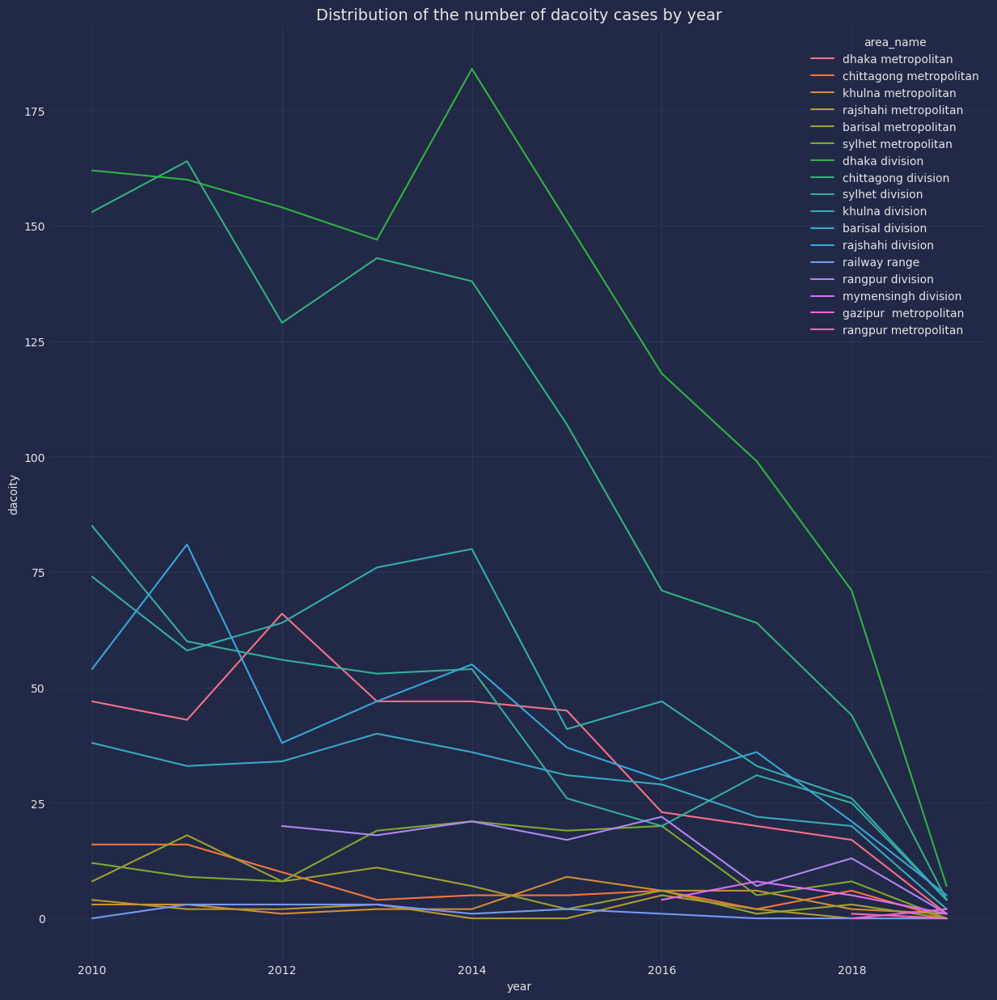

In [9]:
plt.figure(figsize=(15,15))
sns.set_palette('pastel')
plt.title('Distribution of the number of dacoity cases by year',fontsize=14)
sns.lineplot(x = 'year', y = 'dacoity', data = df, hue='area_name')
plt.show()

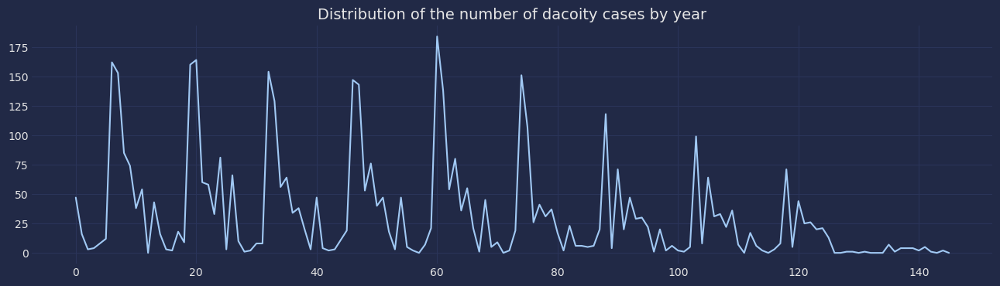

In [10]:
plt.figure(figsize=(16,4));
sns.set_palette('pastel')
plt.title('Distribution of the number of dacoity cases by year',fontsize=14)
plt.plot(df.dacoity)
plt.show()

In [11]:
fig= px.histogram(df, x='year', color='area_name',y='dacoity',marginal='box',template='plotly_dark',hover_data=df.columns,title= 'Distribution of the number of dacoity cases by year', width=1200, height=600)
fig.show()

In [12]:
fig = px.box(df, x='year', y='dacoity', title= 'Distribution of the number of dacoity cases by year', width=1200, height=600,template='plotly_dark')
fig.show()

In [13]:
plot_treemap('dacoity')

In [14]:
df.pivot_table(index='area_name',columns='year',values='dacoity', aggfunc=(['sum']))

sum                                            \
year                      2010   2011   2012   2013   2014   2015   2016   
area_name                                                                  
barisal division          38.0   33.0   34.0   40.0   36.0   31.0   29.0   
barisal metropolitan       8.0   18.0    8.0   11.0    7.0    2.0    6.0   
chittagong division      153.0  164.0  129.0  143.0  138.0  107.0   71.0   
chittagong metropolitan   16.0   16.0   10.0    4.0    5.0    5.0    6.0   
dhaka division           162.0  160.0  154.0  147.0  184.0  151.0  118.0   
dhaka metropolitan        47.0   43.0   66.0   47.0   47.0   45.0   23.0   
gazipur  metropolitan      NaN    NaN    NaN    NaN    NaN    NaN    NaN   
khulna division           74.0   58.0   64.0   76.0   80.0   41.0   47.0   
khulna metropolitan        3.0    3.0    1.0    2.0    2.0    9.0    6.0   
mymensingh division        NaN    NaN    NaN    NaN    NaN    NaN    4.0   
railway range              0.0    3.0    3.0    3.0    1.0    2.0    1.0   
rajshahi division         54.0   81.0   38.0   47.0   55.0   37.0   30.0   
rajshahi metropolitan      4.0    2.0    2.0    3.0    0.0    0.0    5.0   
rangpur division           NaN    NaN   20.0   18.0   21.0   17.0   22.0   
rangpur metropolitan       NaN    NaN    NaN    NaN    NaN    NaN    NaN   
sylhet division           85.0   60.0   56.0   53.0   54.0   26.0   20.0   
sylhet metropolitan       12.0    9.0    8.0   19.0   21.0   19.0   20.0   

                                          
year                     2017  2018 2019  
area_name                                 
barisal division         22.0  20.0  2.0  
barisal metropolitan      1.0   3.0  0.0  
chittagong division      64.0  44.0  4.0  
chittagong metropolitan   2.0   6.0  0.0  
dhaka division           99.0  71.0  7.0  
dhaka metropolitan       20.0  17.0  1.0  
gazipur  metropolitan     NaN   0.0  2.0  
khulna division          33.0  26.0  4.0  
khulna metropolitan       6.0   2.0  1.0  
mymensingh division       8.0   5.0  1.0  
railway range             0.0   0.0  0.0  
rajshahi division        36.0  21.0  5.0  
rajshahi metropolitan     2.0   0.0  0.0  
rangpur division          7.0  13.0  1.0  
rangpur metropolitan      NaN   1.0  0.0  
sylhet division          31.0  25.0  4.0  
sylhet metropolitan       5.0   8.0  0.0

# Distribution of the number of robbery cases by year

In [15]:
df.rename(columns={df.columns[3]: 'robbery'}, inplace=True)

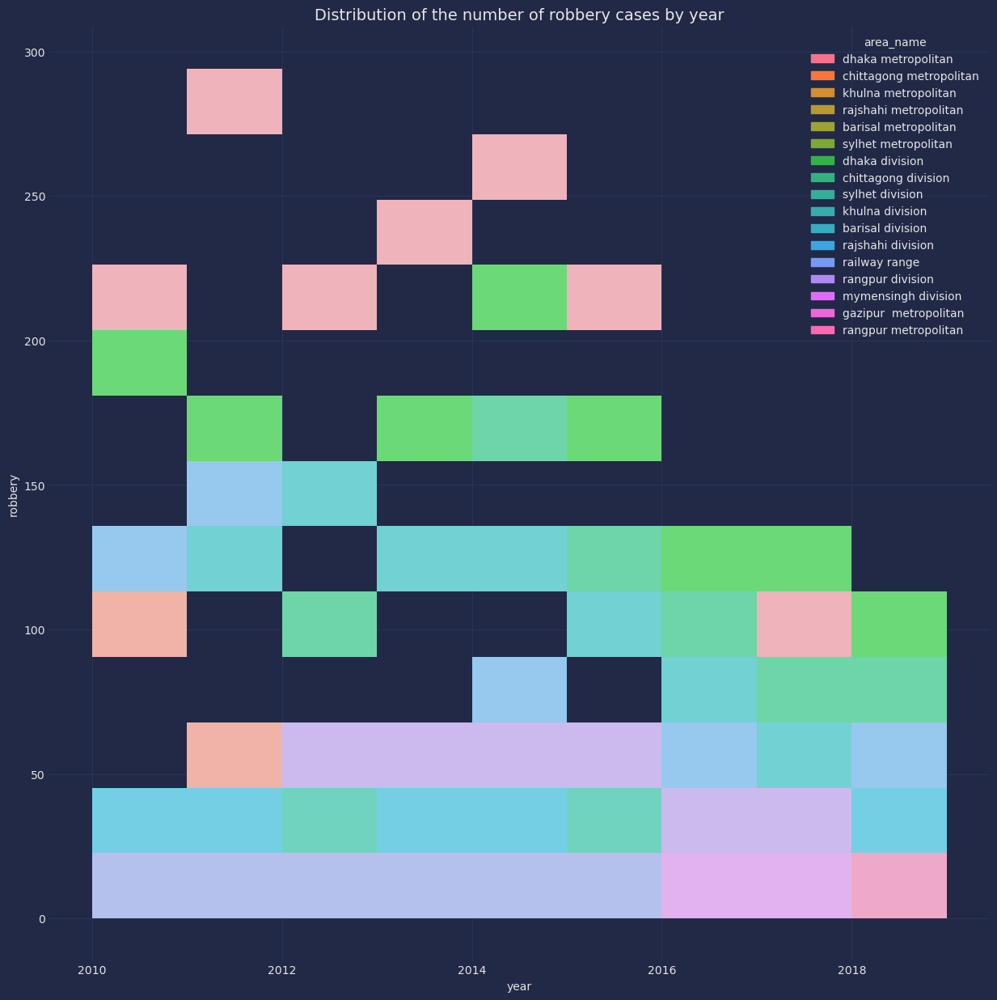

In [16]:
plt.figure(figsize=(15,15))
sns.set_palette('pastel')
plt.title('Distribution of the number of robbery cases by year',fontsize=14)
sns.histplot(x = 'year', y = 'robbery', data = df, hue='area_name')
plt.show()

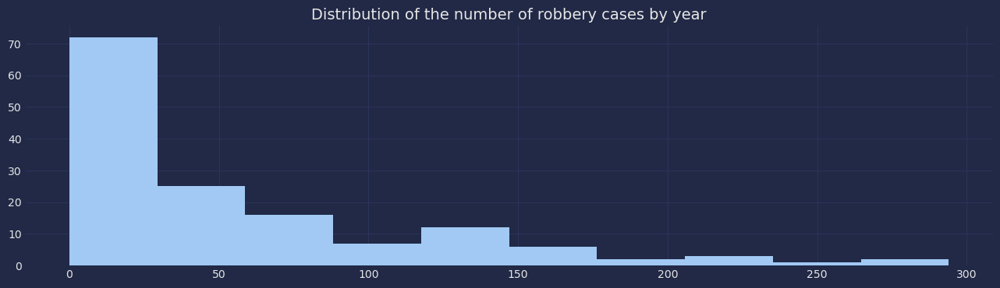

In [17]:
plt.figure(figsize=(16,4));
sns.set_palette('pastel')
plt.title('Distribution of the number of robbery cases by year',fontsize=14);
plt.hist(df.robbery)
plt.show()

In [18]:
fig= px.histogram(df, x='year', color='area_name',y='robbery',marginal='box',template='plotly_dark',hover_data=df.columns,title= 'Distribution of the number of robbery cases by year', width=1200, height=600)
fig.show()

In [19]:
fig = px.box(df, x='year', y='robbery', title= 'Distribution of the number of robbery cases by year', width=1200, height=600,template='plotly_dark')
fig.show()

In [20]:
plot_treemap('robbery')

In [21]:
df.pivot_table(index='area_name',columns='year',values='robbery', aggfunc=(['sum']))

sum                                            \
year                      2010   2011   2012   2013   2014   2015   2016   
area_name                                                                  
barisal division          37.0   43.0   61.0   31.0   37.0   47.0   36.0   
barisal metropolitan      12.0    8.0    9.0   11.0   16.0   11.0    7.0   
chittagong division      122.0  116.0  103.0  132.0  169.0  133.0  105.0   
chittagong metropolitan  108.0   66.0   66.0   55.0   63.0   61.0   58.0   
dhaka division           199.0  174.0  150.0  175.0  221.0  164.0  127.0   
dhaka metropolitan       220.0  294.0  222.0  241.0  265.0  205.0  131.0   
gazipur  metropolitan      NaN    NaN    NaN    NaN    NaN    NaN    NaN   
khulna division          125.0  124.0  151.0  126.0  125.0  112.0   80.0   
khulna metropolitan        9.0   13.0   18.0   30.0   29.0   15.0   11.0   
mymensingh division        NaN    NaN    NaN    NaN    NaN    NaN   15.0   
railway range              1.0    5.0   11.0    8.0    8.0   10.0   10.0   
rajshahi division        130.0  146.0   55.0   63.0   73.0   66.0   49.0   
rajshahi metropolitan     20.0   14.0   24.0   23.0   28.0   19.0   18.0   
rangpur division           NaN    NaN   53.0   62.0   62.0   50.0   29.0   
rangpur metropolitan       NaN    NaN    NaN    NaN    NaN    NaN    NaN   
sylhet division           43.0   42.0   26.0   35.0   30.0   26.0   20.0   
sylhet metropolitan       33.0   24.0   15.0   29.0   29.0   14.0   26.0   

                                            
year                      2017  2018  2019  
area_name                                   
barisal division          36.0  24.0   3.0  
barisal metropolitan       8.0   8.0   0.0  
chittagong division       74.0  84.0  11.0  
chittagong metropolitan   71.0  65.0   3.0  
dhaka division           132.0  96.0  11.0  
dhaka metropolitan       103.0  83.0  10.0  
gazipur  metropolitan      NaN   4.0   3.0  
khulna division           51.0  54.0   4.0  
khulna metropolitan        9.0   6.0   0.0  
mymensingh division       16.0  10.0   1.0  
railway range              7.0   4.0   1.0  
rajshahi division         38.0  53.0   8.0  
rajshahi metropolitan     34.0  27.0   4.0  
rangpur division          29.0  13.0   2.0  
rangpur metropolitan       NaN   1.0   0.0  
sylhet division           31.0  18.0   5.0  
sylhet metropolitan       18.0  12.0   2.0

# Distribution of the number of murder cases by year

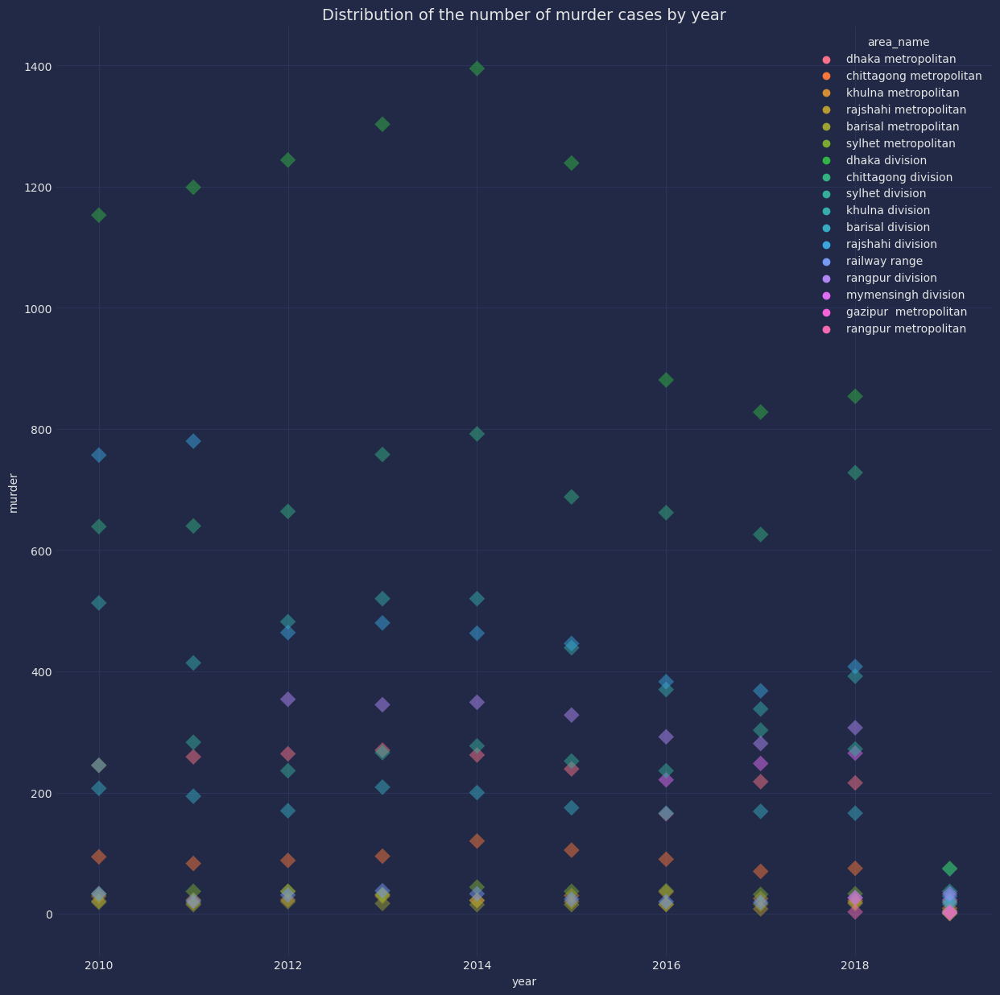

In [22]:
plt.figure(figsize=(15,15))
sns.set_palette('pastel')
plt.title('Distribution of the number of murder cases by year',fontsize=14)
sns.scatterplot(x = 'year', y = 'murder', data = df, hue='area_name', s=100, marker='D', linewidth=0, alpha=0.5)
plt.show()

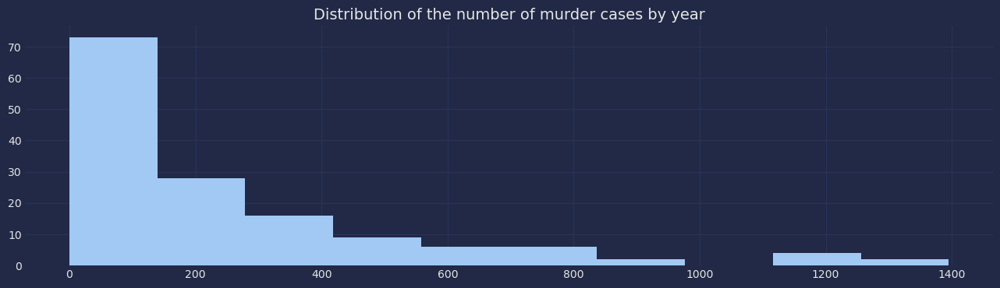

In [23]:
plt.figure(figsize=(16,4));
sns.set_palette('pastel')
plt.title('Distribution of the number of murder cases by year',fontsize=14);
plt.hist(df.murder)
plt.show()

In [24]:
fig= px.histogram(df, x='year', color='area_name',y='murder',marginal='box',template='plotly_dark',hover_data=df.columns,title= 'Distribution of the number of murder cases by year', width=1200, height=600)
fig.show()

In [25]:
fig = px.box(df, x='year', y='murder', title= 'Distribution of the number of murder cases by year', width=1200, height=600,template='plotly_dark')
fig.show()

In [26]:
plot_treemap('murder')

In [27]:
df.pivot_table(index='area_name',columns='year',values='murder', aggfunc=(['sum']))

sum                                          \
year                       2010    2011    2012    2013    2014    2015   
area_name                                                                 
barisal division          207.0   194.0   170.0   209.0   200.0   175.0   
barisal metropolitan       19.0    15.0    20.0    17.0    15.0    15.0   
chittagong division       639.0   640.0   664.0   758.0   792.0   688.0   
chittagong metropolitan    94.0    83.0    88.0    95.0   120.0   105.0   
dhaka division           1153.0  1199.0  1244.0  1303.0  1395.0  1239.0   
dhaka metropolitan        245.0   259.0   264.0   270.0   262.0   239.0   
gazipur  metropolitan       NaN     NaN     NaN     NaN     NaN     NaN   
khulna division           513.0   414.0   482.0   520.0   520.0   439.0   
khulna metropolitan        29.0    23.0    23.0    31.0    22.0    30.0   
mymensingh division         NaN     NaN     NaN     NaN     NaN     NaN   
railway range              33.0    21.0    31.0    38.0    33.0    24.0   
rajshahi division         757.0   780.0   464.0   480.0   463.0   446.0   
rajshahi metropolitan      21.0    18.0    37.0    29.0    22.0    20.0   
rangpur division            NaN     NaN   354.0   345.0   349.0   328.0   
rangpur metropolitan        NaN     NaN     NaN     NaN     NaN     NaN   
sylhet division           245.0   283.0   236.0   266.0   277.0   252.0   
sylhet metropolitan        33.0    37.0    37.0    32.0    44.0    37.0   

                                                    
year                      2016   2017   2018  2019  
area_name                                           
barisal division         166.0  169.0  166.0  16.0  
barisal metropolitan      16.0   16.0   17.0   0.0  
chittagong division      662.0  626.0  728.0  74.0  
chittagong metropolitan   90.0   70.0   75.0   9.0  
dhaka division           881.0  828.0  854.0  75.0  
dhaka metropolitan       165.0  218.0  216.0  19.0  
gazipur  metropolitan      NaN    NaN   26.0   3.0  
khulna division          370.0  338.0  392.0  37.0  
khulna metropolitan       36.0   25.0   19.0   4.0  
mymensingh division      221.0  248.0  265.0  23.0  
railway range             20.0   19.0   27.0   2.0  
rajshahi division        383.0  368.0  408.0  29.0  
rajshahi metropolitan     15.0    8.0   22.0   1.0  
rangpur division         292.0  281.0  307.0  33.0  
rangpur metropolitan       NaN    NaN    3.0   1.0  
sylhet division          236.0  303.0  272.0  20.0  
sylhet metropolitan       38.0   32.0   33.0   5.0

# Distribution of the number of cases of a speedy trial by year

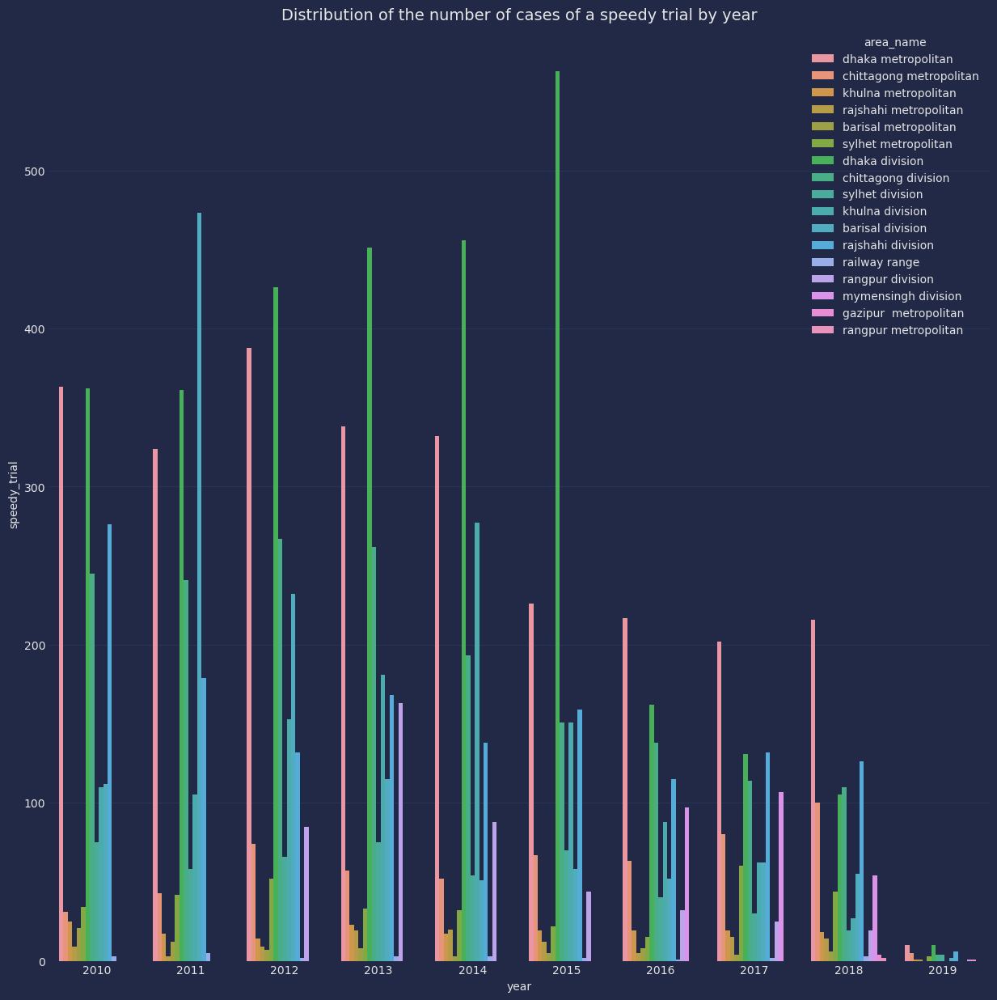

In [28]:
plt.figure(figsize=(15,15))
sns.set_palette('pastel')
plt.title('Distribution of the number of cases of a speedy trial by year',fontsize=14)
sns.barplot(x = 'year', y = 'speedy_trial', data = df, hue='area_name')
plt.show()

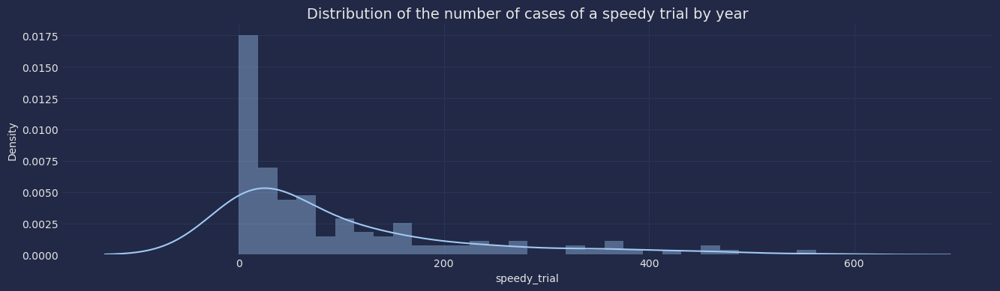

In [29]:
plt.figure(figsize=(16,4));
sns.distplot(df['speedy_trial'],bins=30)
plt.title('Distribution of the number of cases of a speedy trial by year',fontsize=14)
plt.show()

In [30]:
fig= px.histogram(df, x='year', color='area_name',y='speedy_trial',marginal='box',template='plotly_dark',hover_data=df.columns,title= 'Distribution of the number of cases of a speedy trial by year', width=1200, height=600)
fig.show()

In [31]:
fig = px.box(df, x='year', y='speedy_trial', title= 'Distribution of the number of cases of a speedy trial by year', width=1200, height=600,template='plotly_dark')
fig.show()

In [32]:
plot_treemap('speedy_trial')

In [33]:
df.pivot_table(index='area_name',columns='year',values='speedy_trial', aggfunc=(['sum']))

sum                                            \
year                      2010   2011   2012   2013   2014   2015   2016   
area_name                                                                  
barisal division         112.0  473.0  232.0  115.0   51.0   58.0   52.0   
barisal metropolitan      21.0   12.0    7.0    8.0    3.0    5.0    8.0   
chittagong division      245.0  241.0  267.0  262.0  193.0  151.0  138.0   
chittagong metropolitan   31.0   43.0   74.0   57.0   52.0   67.0   63.0   
dhaka division           362.0  361.0  426.0  451.0  456.0  563.0  162.0   
dhaka metropolitan       363.0  324.0  388.0  338.0  332.0  226.0  217.0   
gazipur  metropolitan      NaN    NaN    NaN    NaN    NaN    NaN    NaN   
khulna division          110.0  105.0  153.0  181.0  277.0  151.0   88.0   
khulna metropolitan       25.0   17.0   14.0   23.0   17.0   19.0   19.0   
mymensingh division        NaN    NaN    NaN    NaN    NaN    NaN   97.0   
railway range              3.0    5.0    2.0    3.0    3.0    2.0    1.0   
rajshahi division        276.0  179.0  132.0  168.0  138.0  159.0  115.0   
rajshahi metropolitan      9.0    3.0    9.0   19.0   20.0   12.0    5.0   
rangpur division           NaN    NaN   85.0  163.0   88.0   44.0   32.0   
rangpur metropolitan       NaN    NaN    NaN    NaN    NaN    NaN    NaN   
sylhet division           75.0   58.0   66.0   75.0   54.0   70.0   40.0   
sylhet metropolitan       34.0   42.0   52.0   33.0   32.0   22.0   15.0   

                                             
year                      2017   2018  2019  
area_name                                    
barisal division          62.0   55.0   2.0  
barisal metropolitan       4.0    6.0   0.0  
chittagong division      114.0  110.0   4.0  
chittagong metropolitan   80.0  100.0   5.0  
dhaka division           131.0  105.0  10.0  
dhaka metropolitan       202.0  216.0  10.0  
gazipur  metropolitan      NaN    4.0   1.0  
khulna division           62.0   27.0   0.0  
khulna metropolitan       19.0   18.0   1.0  
mymensingh division      107.0   54.0   1.0  
railway range              2.0    3.0   0.0  
rajshahi division        132.0  126.0   6.0  
rajshahi metropolitan     15.0   14.0   1.0  
rangpur division          25.0   19.0   0.0  
rangpur metropolitan       NaN    2.0   0.0  
sylhet division           30.0   19.0   4.0  
sylhet metropolitan       60.0   44.0   3.0

# Distribution of the number of riot cases by year

In [34]:
df.rename(columns={df.columns[6]: 'riot'}, inplace=True)

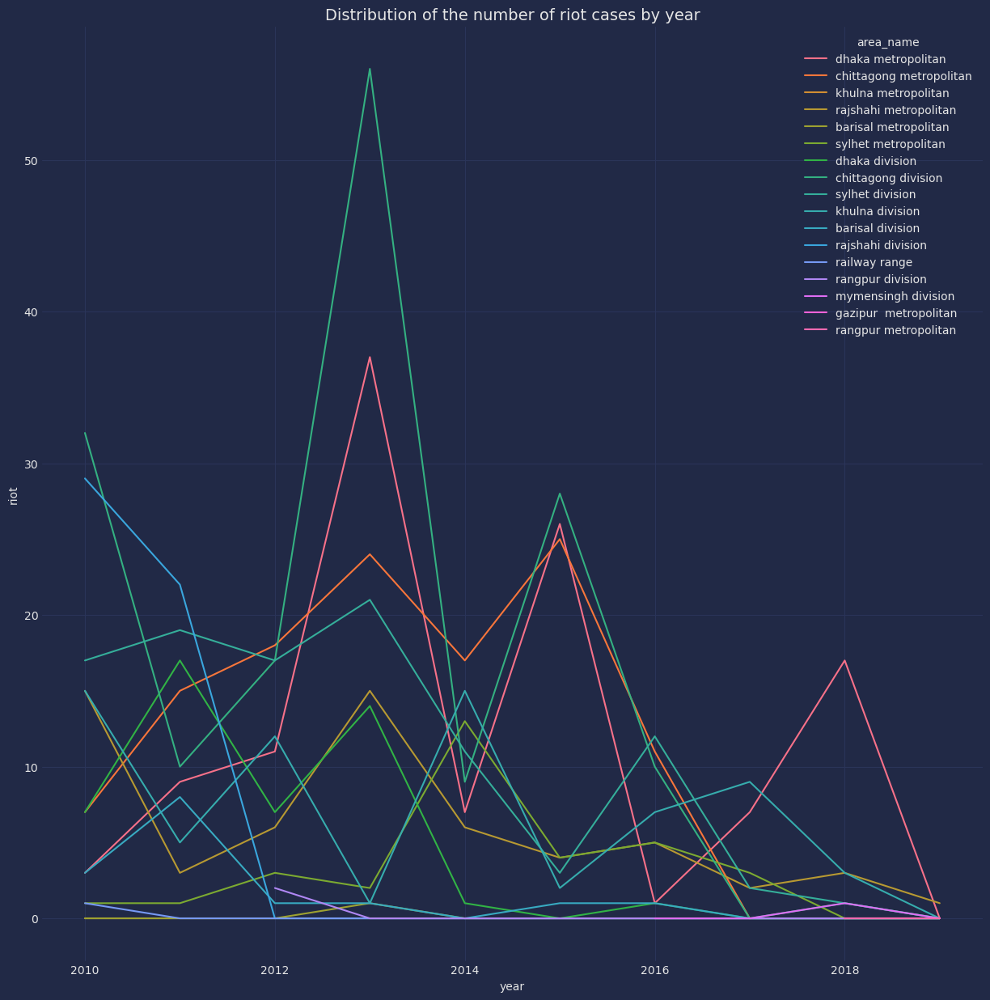

In [35]:
plt.figure(figsize=(15,15))
sns.set_palette('pastel')
plt.title('Distribution of the number of riot cases by year',fontsize=14)
sns.lineplot(x = 'year', y = 'riot', data = df, hue='area_name')
plt.show()

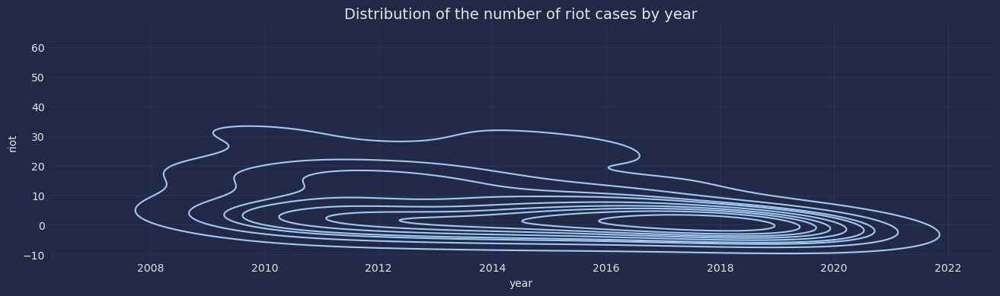

In [36]:
plt.figure(figsize=(16,4))
sns.set_palette('pastel')
plt.title('Distribution of the number of riot cases by year',fontsize=14)
sns.kdeplot(x = 'year', y = 'riot', data = df)
plt.show()

In [37]:
fig= px.histogram(df, x='year', color='area_name',y='riot',marginal='box',template='plotly_dark',hover_data=df.columns,title= 'Distribution of the number of riot cases by year', width=1200, height=600)
fig.show()

In [38]:
fig = px.box(df, x='year', y='riot', title= 'Distribution of the number of riot cases by year', width=1200, height=600,template='plotly_dark')
fig.show()

In [39]:
plot_treemap('riot')

In [40]:
df.pivot_table(index='area_name',columns='year',values='riot', aggfunc=(['sum']))

sum                                                 \
year                     2010  2011  2012  2013  2014  2015  2016 2017  2018   
area_name                                                                      
barisal division          3.0   8.0   1.0   1.0   0.0   1.0   1.0  0.0   0.0   
barisal metropolitan      0.0   0.0   0.0   1.0   0.0   0.0   0.0  0.0   0.0   
chittagong division      32.0  10.0  17.0  56.0   9.0  28.0  10.0  0.0   1.0   
chittagong metropolitan   7.0  15.0  18.0  24.0  17.0  25.0  11.0  0.0   0.0   
dhaka division            7.0  17.0   7.0  14.0   1.0   0.0   1.0  0.0   0.0   
dhaka metropolitan        3.0   9.0  11.0  37.0   7.0  26.0   1.0  7.0  17.0   
gazipur  metropolitan     NaN   NaN   NaN   NaN   NaN   NaN   NaN  NaN   0.0   
khulna division          15.0   5.0  12.0   1.0  15.0   2.0   7.0  9.0   3.0   
khulna metropolitan       0.0   0.0   0.0   0.0   0.0   0.0   0.0  0.0   0.0   
mymensingh division       NaN   NaN   NaN   NaN   NaN   NaN   0.0  0.0   1.0   
railway range             1.0   0.0   0.0   0.0   0.0   0.0   0.0  0.0   0.0   
rajshahi division        29.0  22.0   0.0   0.0   0.0   0.0   0.0  0.0   0.0   
rajshahi metropolitan    15.0   3.0   6.0  15.0   6.0   4.0   5.0  2.0   3.0   
rangpur division          NaN   NaN   2.0   0.0   0.0   0.0   0.0  0.0   0.0   
rangpur metropolitan      NaN   NaN   NaN   NaN   NaN   NaN   NaN  NaN   0.0   
sylhet division          17.0  19.0  17.0  21.0  11.0   3.0  12.0  2.0   1.0   
sylhet metropolitan       1.0   1.0   3.0   2.0  13.0   4.0   5.0  3.0   0.0   

                              
year                    2019  
area_name                     
barisal division         0.0  
barisal metropolitan     0.0  
chittagong division      0.0  
chittagong metropolitan  0.0  
dhaka division           0.0  
dhaka metropolitan       0.0  
gazipur  metropolitan    0.0  
khulna division          0.0  
khulna metropolitan      0.0  
mymensingh division      0.0  
railway range            0.0  
rajshahi division        0.0  
rajshahi metropolitan    1.0  
rangpur division         0.0  
rangpur metropolitan     0.0  
sylhet division          0.0  
sylhet metropolitan      0.0

# Distribution of the number of cases of suppression of women and children by year

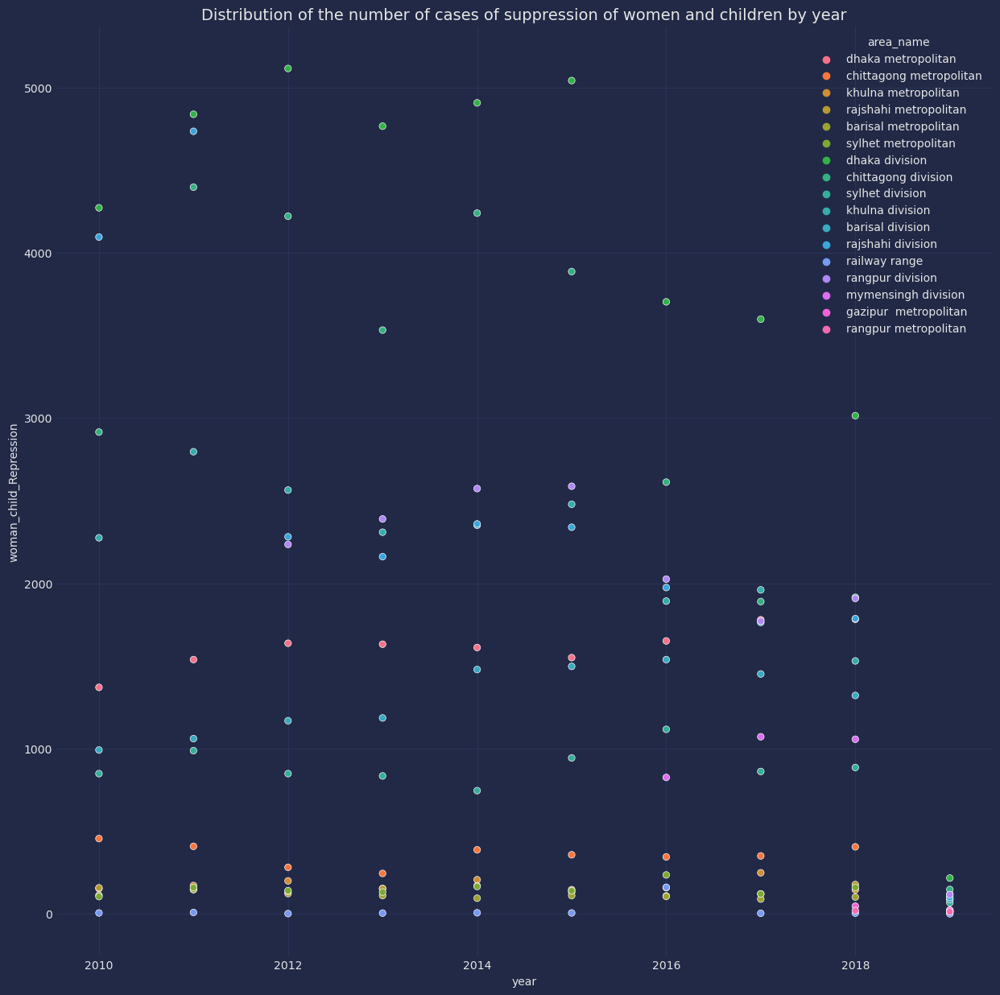

In [41]:
plt.figure(figsize=(15,15))
sns.set_palette('pastel')
plt.title('Distribution of the number of cases of suppression of women and children by year',fontsize=14)
sns.scatterplot(x = 'year', y = 'woman_child_Repression', data = df, hue='area_name')
plt.show()

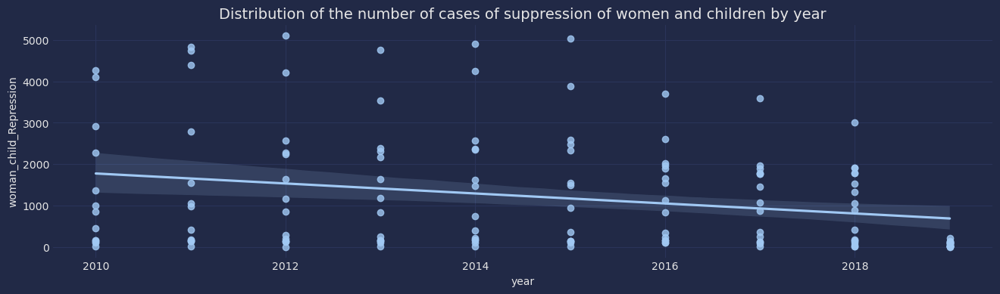

In [42]:
plt.figure(figsize=(16,4))
sns.set_palette('pastel')
plt.title('Distribution of the number of cases of suppression of women and children by year',fontsize=14)
sns.regplot(x = 'year', y = 'woman_child_Repression', data = df)
plt.show()

In [43]:
fig= px.histogram(df, x='year', color='area_name',y='woman_child_Repression',marginal='box',template='plotly_dark',hover_data=df.columns,title= 'Distribution of the number of cases of suppression of women and children by year', width=1200, height=600)
fig.show()

In [44]:
fig = px.box(df, x='year', y='woman_child_Repression', title= 'Distribution of the number of cases of suppression of women and children by year', width=1200, height=600,template='plotly_dark')
fig.show()

In [45]:
plot_treemap('woman_child_Repression')

In [46]:
df.pivot_table(index='area_name',columns='year',values='woman_child_Repression', aggfunc=(['sum']))

sum                                          \
year                       2010    2011    2012    2013    2014    2015   
area_name                                                                 
barisal division          991.0  1060.0  1168.0  1185.0  1478.0  1497.0   
barisal metropolitan      112.0   147.0   135.0   110.0    94.0   110.0   
chittagong division      2915.0  4397.0  4221.0  3532.0  4240.0  3886.0   
chittagong metropolitan   455.0   408.0   281.0   244.0   387.0   357.0   
dhaka division           4272.0  4838.0  5115.0  4766.0  4907.0  5042.0   
dhaka metropolitan       1370.0  1538.0  1637.0  1631.0  1611.0  1550.0   
gazipur  metropolitan       NaN     NaN     NaN     NaN     NaN     NaN   
khulna division          2275.0  2796.0  2564.0  2309.0  2351.0  2478.0   
khulna metropolitan       153.0   171.0   199.0   153.0   206.0   146.0   
mymensingh division         NaN     NaN     NaN     NaN     NaN     NaN   
railway range               5.0     8.0     1.0     4.0     6.0     5.0   
rajshahi division        4095.0  4735.0  2281.0  2161.0  2359.0  2339.0   
rajshahi metropolitan     157.0   146.0   122.0   152.0   169.0   131.0   
rangpur division            NaN     NaN  2235.0  2389.0  2573.0  2587.0   
rangpur metropolitan        NaN     NaN     NaN     NaN     NaN     NaN   
sylhet division           848.0   987.0   848.0   834.0   745.0   943.0   
sylhet metropolitan       104.0   158.0   140.0   131.0   165.0   139.0   

                                                        
year                       2016    2017    2018   2019  
area_name                                               
barisal division         1538.0  1451.0  1321.0   86.0  
barisal metropolitan      105.0    89.0   101.0   14.0  
chittagong division      2612.0  1889.0  1915.0  147.0  
chittagong metropolitan   344.0   350.0   405.0   22.0  
dhaka division           3703.0  3598.0  3014.0  216.0  
dhaka metropolitan       1651.0  1779.0  1782.0  118.0  
gazipur  metropolitan       NaN     NaN    46.0   22.0  
khulna division          1892.0  1960.0  1530.0   99.0  
khulna metropolitan       158.0   248.0   145.0    8.0  
mymensingh division       825.0  1071.0  1056.0   87.0  
railway range             160.0     3.0     4.0    0.0  
rajshahi division        1974.0  1763.0  1786.0   99.0  
rajshahi metropolitan     108.0   120.0   177.0   11.0  
rangpur division         2025.0  1771.0  1908.0  116.0  
rangpur metropolitan        NaN     NaN    19.0   12.0  
sylhet division          1116.0   861.0   885.0   67.0  
sylhet metropolitan       235.0   120.0   159.0   15.0

# Distribution of the number of kidnapping cases by year

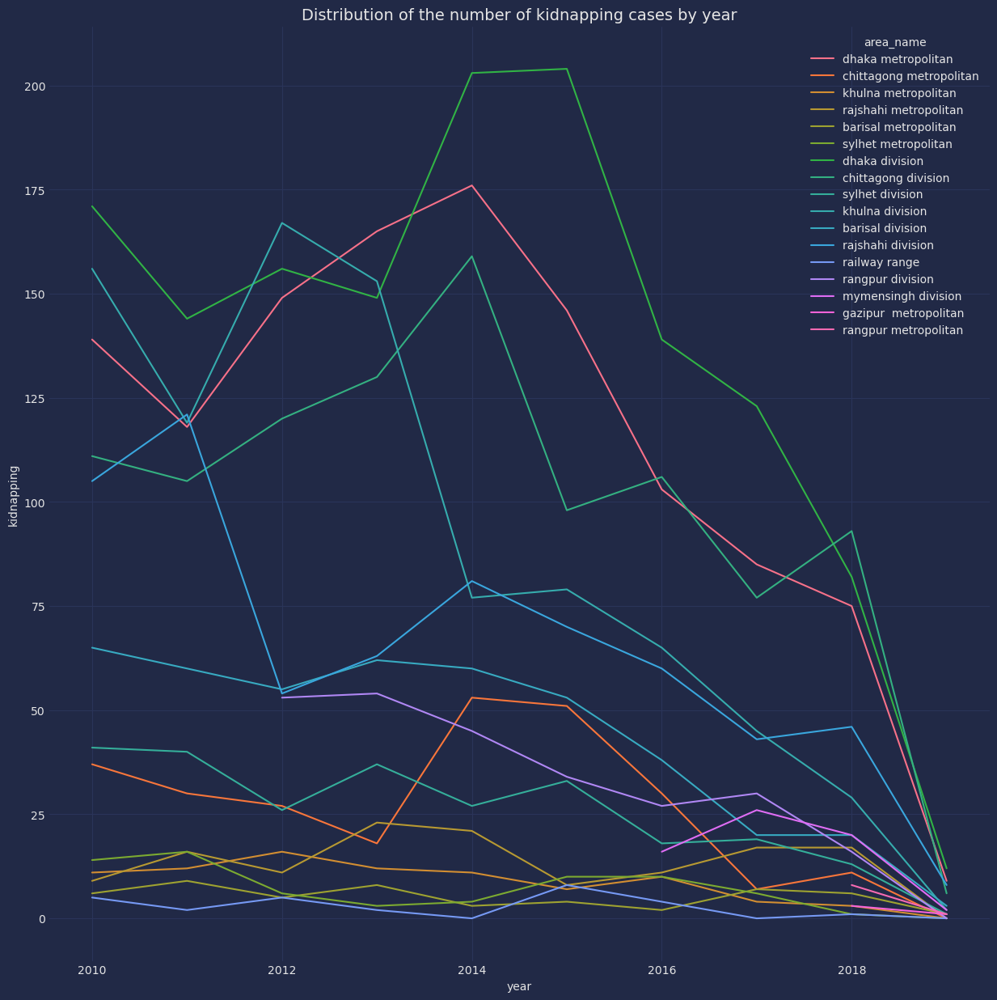

In [47]:
plt.figure(figsize=(15,15))
sns.set_palette('pastel')
plt.title('Distribution of the number of kidnapping cases by year',fontsize=14)
sns.lineplot(x = 'year', y = 'kidnapping', data = df, hue='area_name')
plt.show()

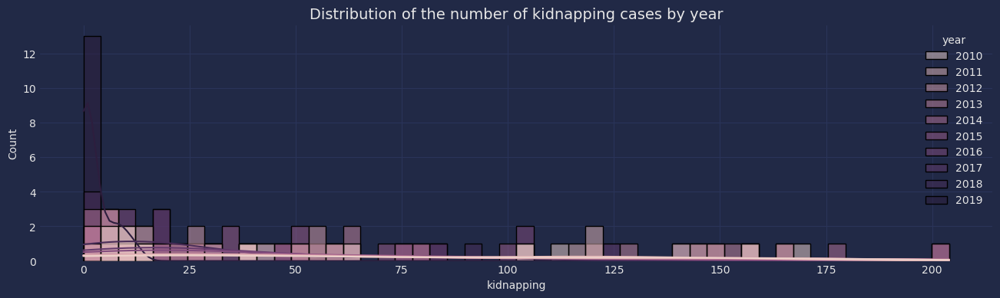

In [48]:
plt.figure(figsize=(16,4))
sns.set_palette('pastel')
sns.histplot(x='kidnapping', hue='year',kde=True, bins=50 ,data=df)
plt.title('Distribution of the number of kidnapping cases by year', fontsize=14)
plt.show()

In [49]:
fig= px.histogram(df, x='year', color='area_name',y='kidnapping',marginal='box',template='plotly_dark',hover_data=df.columns,title= 'Distribution of the number of kidnapping cases by year', width=1200, height=600)
fig.show()

In [50]:
fig = px.box(df, x='year', y='kidnapping', title= 'Distribution of the number of kidnapping cases by year', width=1200, height=600,template='plotly_dark')
fig.show()

In [51]:
plot_treemap('kidnapping')

In [52]:
df.pivot_table(index='area_name',columns='year',values='kidnapping', aggfunc=(['sum']))

sum                                            \
year                      2010   2011   2012   2013   2014   2015   2016   
area_name                                                                  
barisal division          65.0   60.0   55.0   62.0   60.0   53.0   38.0   
barisal metropolitan       6.0    9.0    5.0    8.0    3.0    4.0    2.0   
chittagong division      111.0  105.0  120.0  130.0  159.0   98.0  106.0   
chittagong metropolitan   37.0   30.0   27.0   18.0   53.0   51.0   30.0   
dhaka division           171.0  144.0  156.0  149.0  203.0  204.0  139.0   
dhaka metropolitan       139.0  118.0  149.0  165.0  176.0  146.0  103.0   
gazipur  metropolitan      NaN    NaN    NaN    NaN    NaN    NaN    NaN   
khulna division          156.0  119.0  167.0  153.0   77.0   79.0   65.0   
khulna metropolitan       11.0   12.0   16.0   12.0   11.0    7.0   10.0   
mymensingh division        NaN    NaN    NaN    NaN    NaN    NaN   16.0   
railway range              5.0    2.0    5.0    2.0    0.0    8.0    4.0   
rajshahi division        105.0  121.0   54.0   63.0   81.0   70.0   60.0   
rajshahi metropolitan      9.0   16.0   11.0   23.0   21.0    8.0   11.0   
rangpur division           NaN    NaN   53.0   54.0   45.0   34.0   27.0   
rangpur metropolitan       NaN    NaN    NaN    NaN    NaN    NaN    NaN   
sylhet division           41.0   40.0   26.0   37.0   27.0   33.0   18.0   
sylhet metropolitan       14.0   16.0    6.0    3.0    4.0   10.0   10.0   

                                            
year                      2017  2018  2019  
area_name                                   
barisal division          20.0  20.0   3.0  
barisal metropolitan       7.0   6.0   1.0  
chittagong division       77.0  93.0   6.0  
chittagong metropolitan    7.0  11.0   0.0  
dhaka division           123.0  82.0  12.0  
dhaka metropolitan        85.0  75.0   9.0  
gazipur  metropolitan      NaN   3.0   1.0  
khulna division           45.0  29.0   2.0  
khulna metropolitan        4.0   3.0   0.0  
mymensingh division       26.0  20.0   2.0  
railway range              0.0   1.0   0.0  
rajshahi division         43.0  46.0   8.0  
rajshahi metropolitan     17.0  17.0   0.0  
rangpur division          30.0  16.0   0.0  
rangpur metropolitan       NaN   8.0   1.0  
sylhet division           19.0  13.0   1.0  
sylhet metropolitan        6.0   1.0   0.0

# Distribution of the number of cases of attacks on the police by year

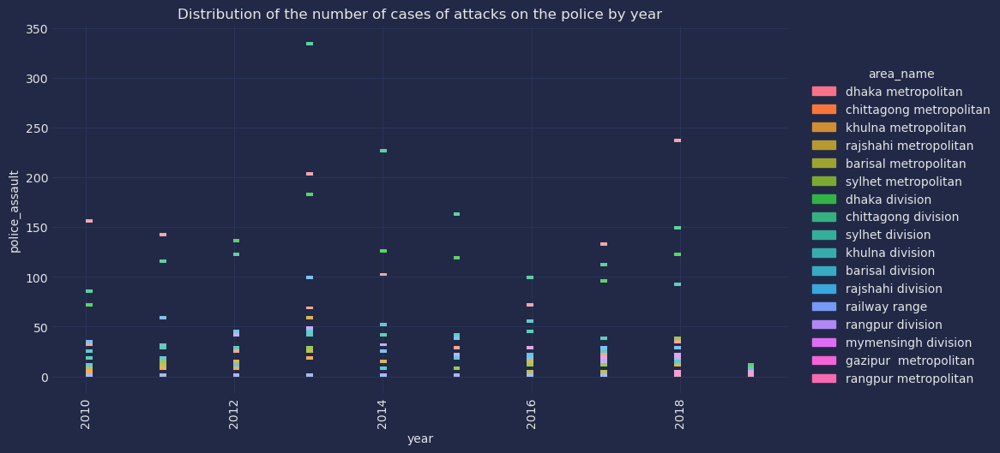

In [53]:
sns.displot(df, x='year',y='police_assault',bins=100, hue='area_name',aspect=1.9).set(title='Distribution of the number of cases of attacks on the police by year')
plt.xticks(rotation=90)
plt.show()

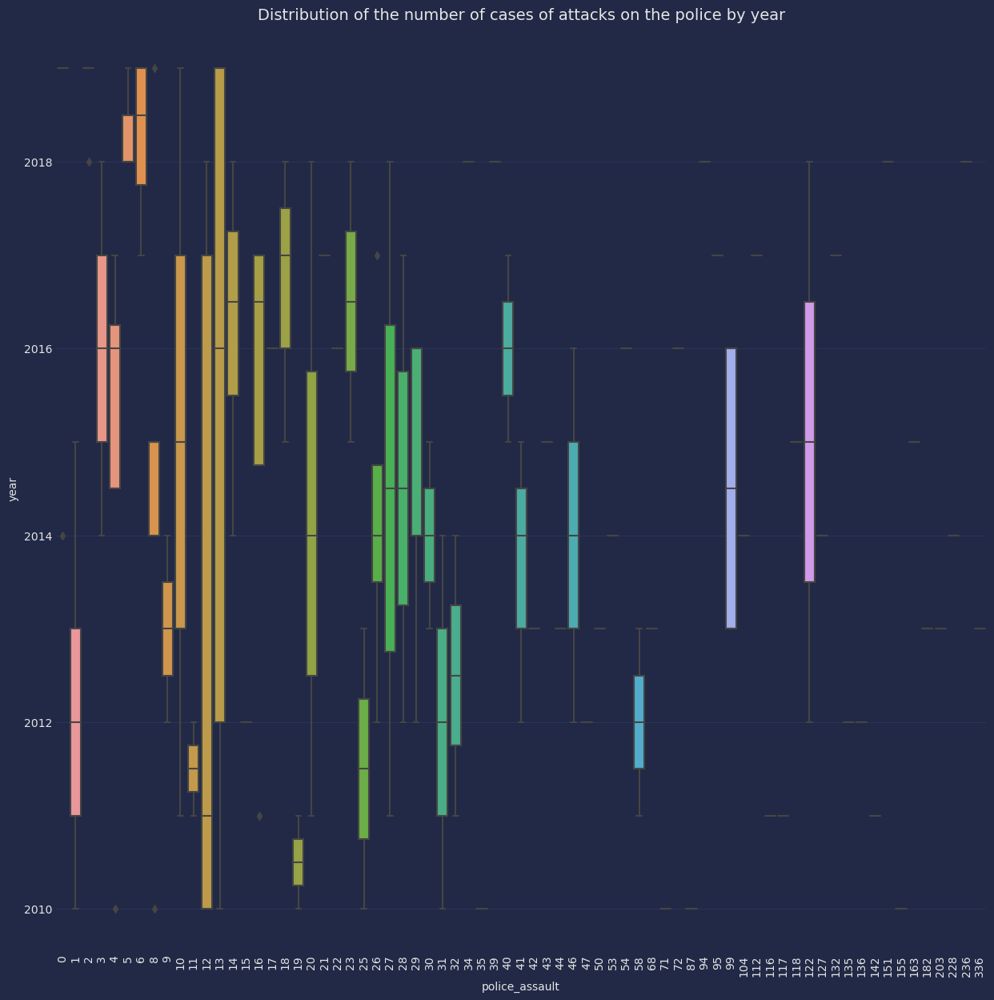

In [54]:
plt.subplots(figsize=(15,15))
plt.xticks(rotation=90)
plt.title('Distribution of the number of cases of attacks on the police by year',fontsize=14)
sns.boxplot(x='police_assault', y='year', data=df)
plt.show()

In [55]:
fig= px.histogram(df, x='year', color='area_name',y='police_assault',marginal='box',template='plotly_dark',hover_data=df.columns,title= 'Distribution of the number of cases of attacks on the police by year', width=1200, height=600)
fig.show()

In [56]:
fig = px.box(df, x='year', y='police_assault', title= 'Distribution of the number of cases of attacks on the police by year', width=1200, height=600,template='plotly_dark')
fig.show()

In [57]:
plot_treemap('police_assault')

In [58]:
df.pivot_table(index='area_name',columns='year',values='police_assault', aggfunc=(['sum']))

sum                                           \
year                      2010   2011   2012   2013   2014   2015  2016   
area_name                                                                 
barisal division          13.0   20.0   13.0   44.0    8.0   20.0  22.0   
barisal metropolitan       8.0   12.0   11.0   25.0    9.0    8.0   4.0   
chittagong division       87.0  116.0  122.0  336.0  228.0  163.0  99.0   
chittagong metropolitan   31.0   19.0   26.0   68.0   31.0   30.0  16.0   
dhaka division            71.0  117.0  135.0  182.0  127.0  118.0  99.0   
dhaka metropolitan       155.0  142.0  136.0  203.0  104.0  118.0  72.0   
gazipur  metropolitan      NaN    NaN    NaN    NaN    NaN    NaN   NaN   
khulna division           25.0   32.0   46.0   99.0   53.0   41.0  54.0   
khulna metropolitan        4.0   10.0    9.0   20.0    3.0    3.0   4.0   
mymensingh division        NaN    NaN    NaN    NaN    NaN    NaN  29.0   
railway range              1.0    1.0    1.0    1.0    0.0    1.0   3.0   
rajshahi division         35.0   58.0   47.0   99.0   26.0   40.0  17.0   
rajshahi metropolitan     12.0   11.0   15.0   58.0   14.0   18.0  14.0   
rangpur division           NaN    NaN   41.0   50.0   32.0   23.0  29.0   
rangpur metropolitan       NaN    NaN    NaN    NaN    NaN    NaN   NaN   
sylhet division           19.0   27.0   29.0   42.0   41.0   43.0  46.0   
sylhet metropolitan       12.0   16.0   28.0   30.0   26.0    8.0  13.0   

                                             
year                      2017   2018  2019  
area_name                                    
barisal division          16.0   20.0   2.0  
barisal metropolitan       4.0    6.0   0.0  
chittagong division      112.0  151.0  10.0  
chittagong metropolitan   21.0   34.0   5.0  
dhaka division            95.0  122.0  13.0  
dhaka metropolitan       132.0  236.0   6.0  
gazipur  metropolitan      NaN    5.0   2.0  
khulna division           26.0   14.0   2.0  
khulna metropolitan        6.0    3.0   0.0  
mymensingh division       18.0   23.0   6.0  
railway range              3.0    5.0   0.0  
rajshahi division         28.0   27.0   2.0  
rajshahi metropolitan     14.0   12.0   0.0  
rangpur division          16.0   18.0   0.0  
rangpur metropolitan       NaN    2.0   0.0  
sylhet division           40.0   94.0   8.0  
sylhet metropolitan       12.0   39.0  13.0

# Year & area name vs burglary

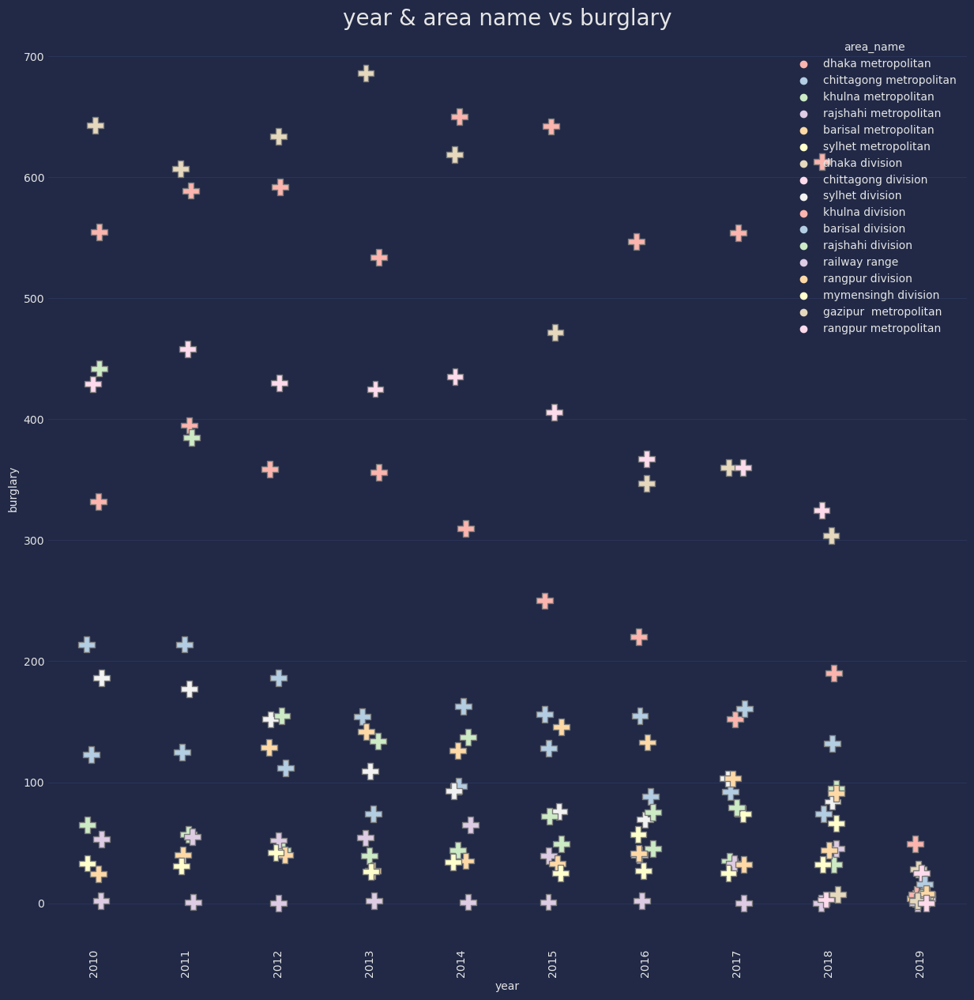

In [59]:
fig, ax = plt.subplots(figsize=(15,15))
plt.xticks(rotation=90)
ax = sns.stripplot(y='burglary', x='year',hue='area_name', data=df, palette='Pastel1', s=15, marker='P', linewidth=1, alpha=1)
plt.title('year & area name vs burglary',fontsize = 20)
plt.show()

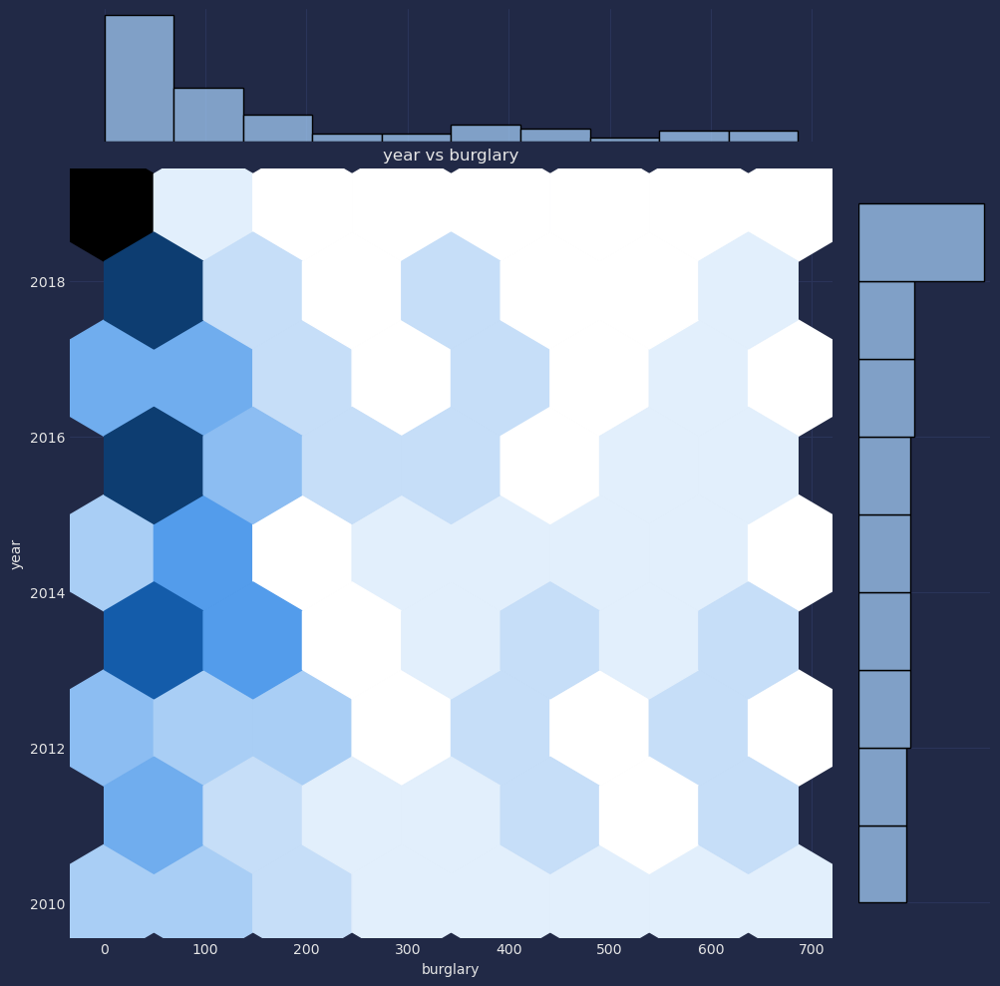

In [60]:
sns.jointplot(x='burglary', y='year', data=df , height = 10 , kind='hex')
plt.title('year vs burglary',fontsize = 12)
plt.show()

In [61]:
fig= px.histogram(df, x='year', color='area_name',y='burglary',marginal='box',template='plotly_dark',hover_data=df.columns,title= 'year & area name vs burglary', width=1200, height=600)
fig.show()

In [62]:
fig = px.box(df, x='year', y='burglary', title= 'year & area name vs burglary', width=1200, height=600,template='plotly_dark')
fig.show()

In [63]:
plot_treemap('burglary')

In [64]:
df.pivot_table(index='area_name',columns='year',values='burglary', aggfunc=(['sum']))

sum                                            \
year                      2010   2011   2012   2013   2014   2015   2016   
area_name                                                                  
barisal division         214.0  214.0  186.0  154.0  163.0  156.0  155.0   
barisal metropolitan      24.0   40.0   40.0   27.0   35.0   33.0   41.0   
chittagong division      429.0  458.0  430.0  425.0  435.0  406.0  367.0   
chittagong metropolitan  123.0  125.0  112.0   74.0   97.0  128.0   88.0   
dhaka division           643.0  607.0  634.0  686.0  619.0  472.0  347.0   
dhaka metropolitan       555.0  589.0  592.0  534.0  650.0  642.0  547.0   
gazipur  metropolitan      NaN    NaN    NaN    NaN    NaN    NaN    NaN   
khulna division          332.0  395.0  359.0  356.0  310.0  250.0  220.0   
khulna metropolitan       65.0   57.0   44.0   39.0   44.0   49.0   45.0   
mymensingh division        NaN    NaN    NaN    NaN    NaN    NaN   57.0   
railway range              2.0    1.0    0.0    2.0    1.0    1.0    2.0   
rajshahi division        442.0  385.0  155.0  134.0  137.0   72.0   75.0   
rajshahi metropolitan     53.0   55.0   52.0   54.0   65.0   39.0   40.0   
rangpur division           NaN    NaN  129.0  142.0  126.0  146.0  133.0   
rangpur metropolitan       NaN    NaN    NaN    NaN    NaN    NaN    NaN   
sylhet division          186.0  177.0  152.0  109.0   93.0   76.0   69.0   
sylhet metropolitan       33.0   31.0   42.0   26.0   34.0   25.0   27.0   

                                             
year                      2017   2018  2019  
area_name                                    
barisal division         161.0  132.0  16.0  
barisal metropolitan      32.0   44.0   4.0  
chittagong division      360.0  325.0  25.0  
chittagong metropolitan   92.0   74.0   6.0  
dhaka division           360.0  304.0  28.0  
dhaka metropolitan       554.0  613.0  49.0  
gazipur  metropolitan      NaN    7.0   2.0  
khulna division          152.0  190.0   7.0  
khulna metropolitan       35.0   32.0   6.0  
mymensingh division       74.0   66.0   5.0  
railway range              0.0    0.0   0.0  
rajshahi division         79.0   95.0   5.0  
rajshahi metropolitan     33.0   45.0   4.0  
rangpur division         103.0   91.0   8.0  
rangpur metropolitan       NaN    3.0   0.0  
sylhet division          103.0   84.0   7.0  
sylhet metropolitan       25.0   32.0   2.0

# Distribution of the number of cases of theft by year

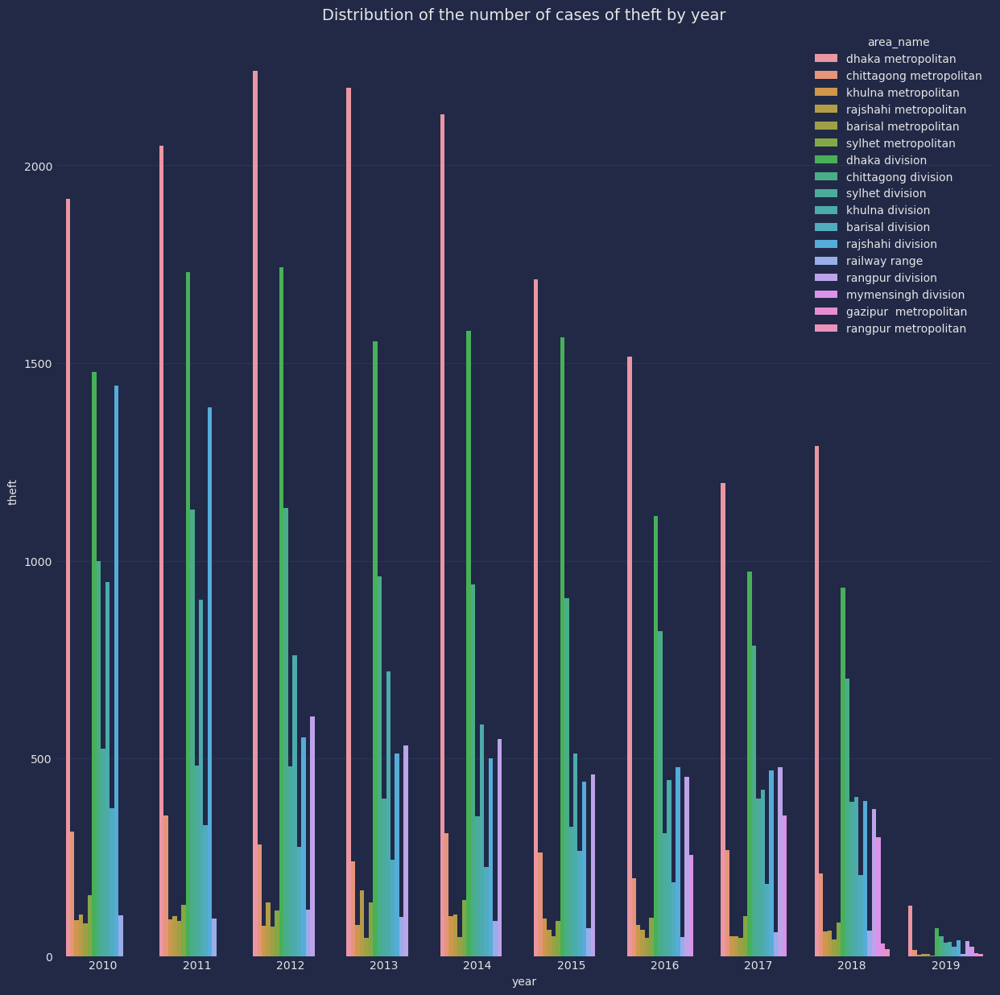

In [65]:
plt.figure(figsize=(15,15))
sns.set_palette('pastel')
plt.title('Distribution of the number of cases of theft by year',fontsize=14)
sns.barplot(x = 'year', y = 'theft', data = df, hue='area_name')
plt.show()

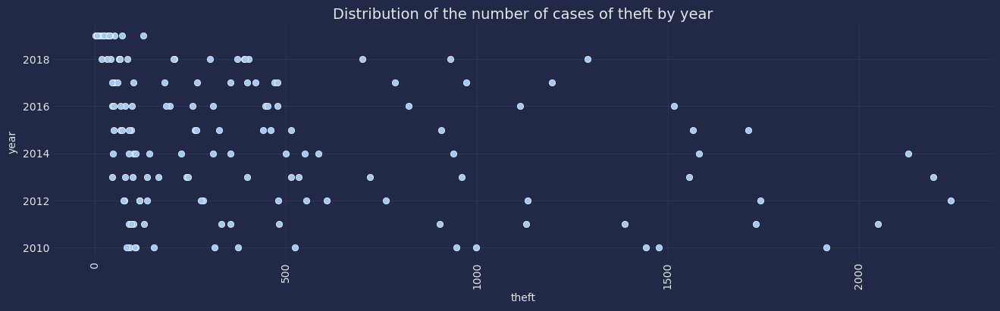

In [66]:
plt.subplots(figsize=(16,4))
plt.xticks(rotation=90)
plt.title('Distribution of the number of cases of theft by year',fontsize=14)
sns.scatterplot(x='theft', y='year', data=df)
plt.show()

In [67]:
fig= px.histogram(df, x='year', color='area_name',y='theft',marginal='box',template='plotly_dark',hover_data=df.columns,title= 'Distribution of the number of cases of theft by year', width=1200, height=600)
fig.show()

In [68]:
fig = px.box(df, x='year', y='theft', title= 'Distribution of the number of cases of theft by year', width=1200, height=600,template='plotly_dark')
fig.show()

In [69]:
plot_treemap('theft')

In [70]:
df.pivot_table(index='area_name',columns='year',values='theft', aggfunc=(['sum']))

sum                                          \
year                       2010    2011    2012    2013    2014    2015   
area_name                                                                 
barisal division          374.0   331.0   277.0   244.0   225.0   266.0   
barisal metropolitan       83.0    88.0    75.0    46.0    48.0    50.0   
chittagong division       998.0  1130.0  1134.0   960.0   939.0   906.0   
chittagong metropolitan   314.0   355.0   283.0   239.0   310.0   262.0   
dhaka division           1477.0  1731.0  1742.0  1555.0  1582.0  1565.0   
dhaka metropolitan       1915.0  2050.0  2240.0  2196.0  2130.0  1711.0   
gazipur  metropolitan       NaN     NaN     NaN     NaN     NaN     NaN   
khulna division           947.0   902.0   761.0   720.0   585.0   513.0   
khulna metropolitan        91.0    92.0    76.0    78.0   101.0    95.0   
mymensingh division         NaN     NaN     NaN     NaN     NaN     NaN   
railway range             104.0    95.0   117.0    98.0    89.0    71.0   
rajshahi division        1442.0  1388.0   554.0   513.0   500.0   441.0   
rajshahi metropolitan     106.0   101.0   136.0   166.0   106.0    66.0   
rangpur division            NaN     NaN   607.0   533.0   549.0   460.0   
rangpur metropolitan        NaN     NaN     NaN     NaN     NaN     NaN   
sylhet division           524.0   481.0   480.0   398.0   354.0   326.0   
sylhet metropolitan       154.0   129.0   116.0   136.0   142.0    89.0   

                                                        
year                       2016    2017    2018   2019  
area_name                                               
barisal division          187.0   182.0   205.0   23.0  
barisal metropolitan       45.0    46.0    42.0    6.0  
chittagong division       821.0   786.0   701.0   51.0  
chittagong metropolitan   196.0   267.0   208.0   15.0  
dhaka division           1114.0   973.0   931.0   70.0  
dhaka metropolitan       1516.0  1197.0  1290.0  127.0  
gazipur  metropolitan       NaN     NaN    32.0    8.0  
khulna division           446.0   420.0   403.0   36.0  
khulna metropolitan        78.0    50.0    63.0    4.0  
mymensingh division       256.0   355.0   301.0   24.0  
railway range              49.0    60.0    65.0    5.0  
rajshahi division         477.0   470.0   392.0   40.0  
rajshahi metropolitan      66.0    50.0    64.0    6.0  
rangpur division          453.0   477.0   372.0   38.0  
rangpur metropolitan        NaN     NaN    17.0    6.0  
sylhet division           310.0   399.0   390.0   33.0  
sylhet metropolitan        96.0   101.0    85.0    2.0

# Distribution of the number of other cases by year

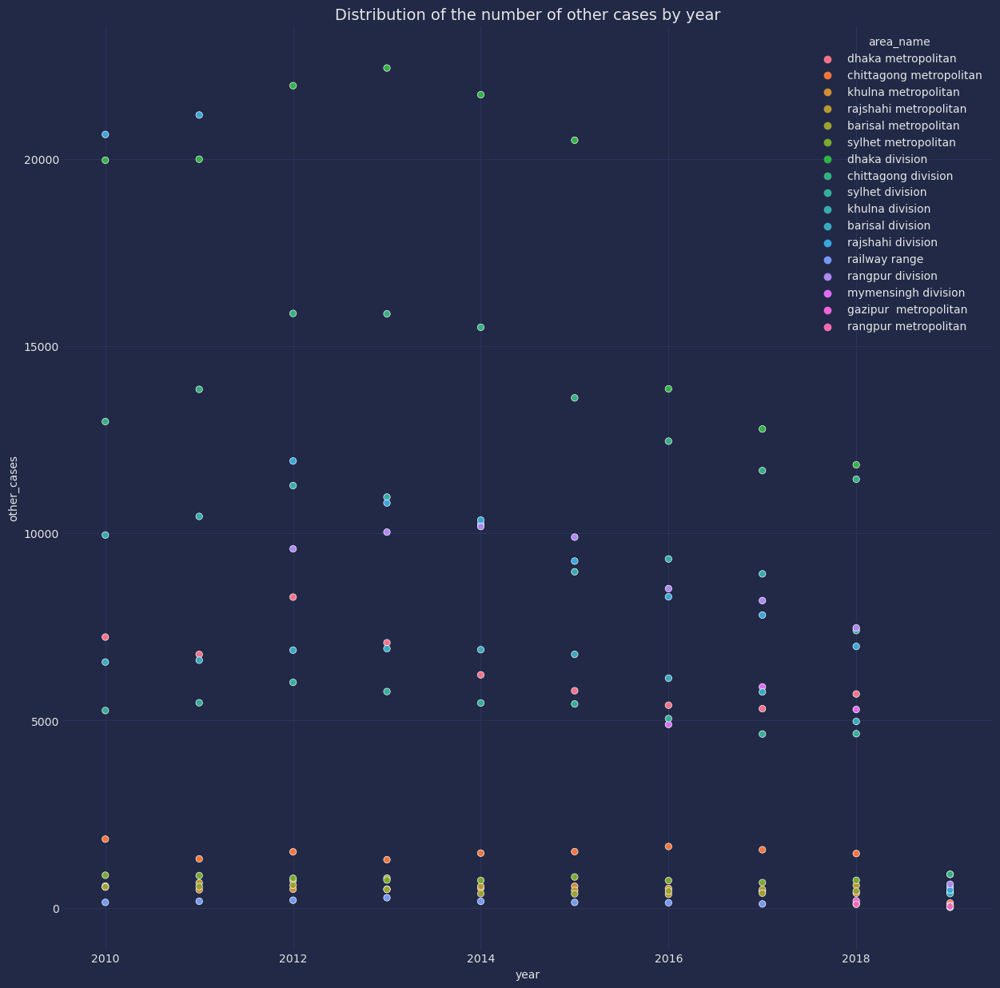

In [71]:
plt.figure(figsize=(15,15))
sns.set_palette('pastel')
plt.title('Distribution of the number of other cases by year',fontsize=14)
sns.scatterplot(x = 'year', y = 'other_cases', data = df, hue='area_name')
plt.show()

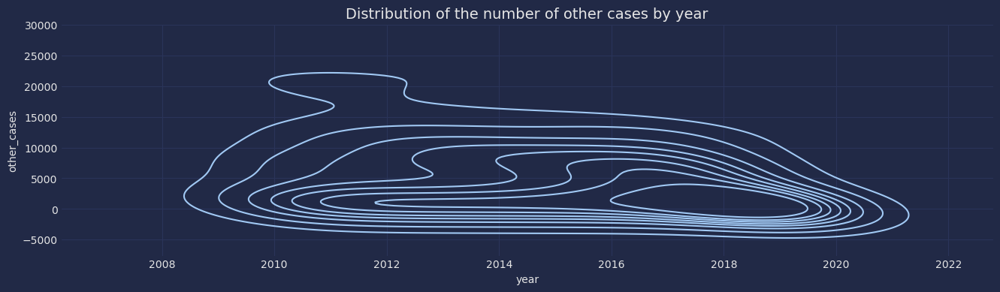

In [72]:
plt.figure(figsize=(16,4))
sns.set_palette('pastel')
plt.title('Distribution of the number of other cases by year',fontsize=14)
sns.kdeplot(x = 'year', y = 'other_cases', data = df, shade_lowest=True)
plt.show()

In [73]:
fig= px.histogram(df, x='year', color='area_name',y='other_cases',marginal='box',template='plotly_dark',hover_data=df.columns,title= 'Distribution of the number of other cases by year', width=1200, height=600)
fig.show()

In [74]:
fig = px.box(df, x='year', y='other_cases', title= 'Distribution of the number of other cases by year', width=1200, height=600,template='plotly_dark')
fig.show()

In [75]:
plot_treemap('other_cases')

In [76]:
df.pivot_table(index='area_name',columns='year',values='other_cases', aggfunc=(['sum']))

sum                                               \
year                        2010     2011     2012     2013     2014     2015   
area_name                                                                       
barisal division          6561.0   6611.0   6879.0   6920.0   6892.0   6767.0   
barisal metropolitan       557.0    564.0    600.0    487.0    375.0    371.0   
chittagong division      12985.0  13846.0  15873.0  15863.0  15503.0  13618.0   
chittagong metropolitan   1831.0   1304.0   1492.0   1281.0   1457.0   1497.0   
dhaka division           19966.0  19993.0  21957.0  22429.0  21716.0  20501.0   
dhaka metropolitan        7228.0   6766.0   8296.0   7077.0   6219.0   5795.0   
gazipur  metropolitan        NaN      NaN      NaN      NaN      NaN      NaN   
khulna division           9954.0  10452.0  11275.0  10968.0  10247.0   8972.0   
khulna metropolitan        551.0    478.0    493.0    494.0    522.0    574.0   
mymensingh division          NaN      NaN      NaN      NaN      NaN      NaN   
railway range              142.0    172.0    199.0    266.0    170.0    141.0   
rajshahi division        20654.0  21174.0  11932.0  10810.0  10353.0   9259.0   
rajshahi metropolitan      578.0    665.0    728.0    791.0    569.0    463.0   
rangpur division             NaN      NaN   9586.0  10032.0  10181.0   9898.0   
rangpur metropolitan         NaN      NaN      NaN      NaN      NaN      NaN   
sylhet division           5266.0   5473.0   6018.0   5773.0   5468.0   5442.0   
sylhet metropolitan        866.0    857.0    784.0    739.0    728.0    819.0   

                                                           
year                        2016     2017     2018   2019  
area_name                                                  
barisal division          6130.0   5763.0   4975.0  378.0  
barisal metropolitan       444.0    388.0    441.0   49.0  
chittagong division      12461.0  11676.0  11445.0  891.0  
chittagong metropolitan   1634.0   1547.0   1446.0  125.0  
dhaka division           13859.0  12787.0  11830.0  889.0  
dhaka metropolitan        5407.0   5315.0   5708.0  411.0  
gazipur  metropolitan        NaN      NaN    183.0   65.0  
khulna division           9315.0   8917.0   7402.0  544.0  
khulna metropolitan        514.0    443.0    385.0   16.0  
mymensingh division       4893.0   5897.0   5294.0  405.0  
railway range              131.0    100.0    108.0    9.0  
rajshahi division         8304.0   7817.0   6979.0  469.0  
rajshahi metropolitan      357.0    485.0    597.0   52.0  
rangpur division          8523.0   8203.0   7474.0  625.0  
rangpur metropolitan         NaN      NaN     90.0   33.0  
sylhet division           5051.0   4638.0   4648.0  412.0  
sylhet metropolitan        724.0    669.0    731.0   55.0

# Distribution of: recovery cases arms act,recovery cases explosive, recovery cases narcotics, recovery cases smuggling

In [77]:
fig=px.line(df,x='year',y=['recovery_cases_arms_act','recovery_cases_explosive','recovery_cases_narcotics','recovery_cases_smuggling'],template='ggplot2',title='<b>Distribution of: recovery cases arms act,recovery cases explosive, recovery cases narcotics, recovery cases smuggling')
fig.show()
names=['recovery_cases_arms_act','recovery_cases_explosive','recovery_cases_narcotics','recovery_cases_smuggling']
values=[df['recovery_cases_arms_act'].sum(),df['recovery_cases_explosive'].sum(),df['recovery_cases_narcotics'].sum(),df['recovery_cases_smuggling'].sum()]
fig=px.pie(names=names,values=values,hole=.7,template='ggplot2')
fig.update_layout(title_x=0.5,legend=dict(orientation='h',yanchor='bottom',y=1.02,xanchor='right',x=1))

In [78]:
df.groupby('area_name')[['recovery_cases_arms_act','recovery_cases_explosive','recovery_cases_narcotics','recovery_cases_smuggling']].agg(['sum'])

,recovery_cases_arms_act,recovery_cases_explosive,recovery_cases_narcotics,recovery_cases_smuggling
,sum,sum,sum,sum
area_name,,,,
barisal division,379,154,13329,213
barisal metropolitan,136,7,5488,267
chittagong division,3886,430,69094,3067
chittagong metropolitan,1356,240,23851,438
dhaka division,2832,569,114018,5402
dhaka metropolitan,2452,1492,93490,1270
gazipur metropolitan,21,15,658,3
khulna division,2685,1093,42373,10361


In [79]:
df.pivot_table(index='area_name',columns='year',values=['recovery_cases_arms_act','recovery_cases_explosive'], aggfunc=(['sum']))

sum                              \
                        recovery_cases_arms_act                               
year                                       2010   2011   2012   2013   2014   
area_name                                                                     
barisal division                           33.0   41.0   44.0   27.0   36.0   
barisal metropolitan                       17.0   11.0   16.0   16.0   16.0   
chittagong division                       235.0  192.0  232.0  320.0  490.0   
chittagong metropolitan                    51.0   89.0  121.0   79.0  121.0   
dhaka division                            309.0  260.0  315.0  296.0  331.0   
dhaka metropolitan                        518.0  358.0  284.0  242.0  225.0   
gazipur  metropolitan                       NaN    NaN    NaN    NaN    NaN   
khulna division                           211.0  152.0  260.0  253.0  381.0   
khulna metropolitan                        19.0   14.0   17.0   23.0   34.0   
mymensingh division                         NaN    NaN    NaN    NaN    NaN   
railway range                               1.0    3.0    5.0    3.0   10.0   
rajshahi division                         134.0  114.0  131.0  163.0  249.0   
rajshahi metropolitan                       3.0    8.0    5.0   22.0   18.0   
rangpur division                            NaN    NaN   32.0   27.0   62.0   
rangpur metropolitan                        NaN    NaN    NaN    NaN    NaN   
sylhet division                            30.0   19.0   38.0   27.0   38.0   
sylhet metropolitan                        14.0    8.0   11.0   19.0   12.0   

                                                           \
                                                            
year                      2015   2016   2017   2018  2019   
area_name                                                   
barisal division          26.0   58.0   59.0   54.0   1.0   
barisal metropolitan      17.0   15.0   11.0   16.0   1.0   
chittagong division      498.0  561.0  581.0  723.0  54.0   
chittagong metropolitan  101.0  160.0  231.0  365.0  38.0   
dhaka division           365.0  356.0  290.0  292.0  18.0   
dhaka metropolitan       263.0  244.0  157.0  155.0   6.0   
gazipur  metropolitan      NaN    NaN    NaN   18.0   3.0   
khulna division          330.0  374.0  342.0  369.0  13.0   
khulna metropolitan       21.0   17.0   25.0   24.0   2.0   
mymensingh division        NaN   36.0   36.0   53.0   5.0   
railway range              4.0    5.0    3.0    2.0   0.0   
rajshahi division        313.0  345.0  343.0  257.0  25.0   
rajshahi metropolitan     23.0   13.0   18.0   35.0   3.0   
rangpur division          53.0   45.0   50.0   72.0   4.0   
rangpur metropolitan       NaN    NaN    NaN    2.0   0.0   
sylhet division           54.0   45.0   49.0   62.0   1.0   
sylhet metropolitan       11.0   17.0   13.0   16.0   0.0   

                                                                             \
                        recovery_cases_explosive                              
year                                        2010  2011   2012   2013   2014   
area_name                                                                     
barisal division                             5.0   6.0   11.0   15.0   19.0   
barisal metropolitan                         0.0   0.0    0.0    4.0    1.0   
chittagong division                         20.0  20.0   13.0   91.0   53.0   
chittagong metropolitan                      0.0   4.0    5.0   37.0   10.0   
dhaka division                              30.0  25.0   28.0  133.0   64.0   
dhaka metropolitan                          82.0  77.0   94.0  387.0  104.0   
gazipur  metropolitan                        NaN   NaN    NaN    NaN    NaN   
khulna division                             96.0  60.0  110.0  148.0  152.0   
khulna metropolitan                          2.0   3.0    7.0   14.0    2.0   
mymensingh division                          NaN   NaN    NaN    NaN    NaN

In [80]:
df.pivot_table(index='area_name',columns='year',values=['recovery_cases_narcotics','recovery_cases_smuggling'], aggfunc=(['sum']))

sum                             \
                        recovery_cases_narcotics                              
year                                        2010     2011     2012     2013   
area_name                                                                     
barisal division                           334.0    350.0    444.0    502.0   
barisal metropolitan                       155.0    196.0    459.0    607.0   
chittagong division                       4730.0   4122.0   4613.0   4801.0   
chittagong metropolitan                    866.0   1541.0   1976.0   1977.0   
dhaka division                            4459.0   7497.0  10918.0  11139.0   
dhaka metropolitan                       10535.0  10405.0   8345.0   7927.0   
gazipur  metropolitan                        NaN      NaN      NaN      NaN   
khulna division                           2292.0   2168.0   3372.0   2286.0   
khulna metropolitan                        792.0    495.0    437.0    442.0   
mymensingh division                          NaN      NaN      NaN      NaN   
railway range                              176.0    264.0    331.0    264.0   
rajshahi division                         3614.0   2763.0   3120.0   2716.0   
rajshahi metropolitan                      332.0    253.0    229.0    144.0   
rangpur division                             NaN      NaN   1083.0   1213.0   
rangpur metropolitan                         NaN      NaN      NaN      NaN   
sylhet division                            905.0   1464.0   1751.0   1620.0   
sylhet metropolitan                        154.0    178.0    186.0    194.0   

                                                                              \
                                                                               
year                        2014     2015     2016     2017     2018    2019   
area_name                                                                      
barisal division           813.0   1019.0   1679.0   3441.0   4384.0   363.0   
barisal metropolitan       759.0    557.0    655.0    921.0   1088.0    91.0   
chittagong division       6817.0   8012.0   8998.0  12555.0  13338.0  1108.0   
chittagong metropolitan   2488.0   2090.0   3457.0   4260.0   4747.0   449.0   
dhaka division           12175.0  12405.0  11366.0  19646.0  22682.0  1731.0   
dhaka metropolitan        7063.0   8365.0   9627.0  13638.0  16215.0  1370.0   
gazipur  metropolitan        NaN      NaN      NaN      NaN    528.0   130.0   
khulna division           2935.0   3787.0   4879.0   9764.0  10076.0   814.0   
khulna metropolitan        599.0    659.0    801.0   1706.0   1858.0   272.0   
mymensingh division          NaN      NaN   3099.0   5398.0   6329.0   435.0   
railway range              395.0    496.0    518.0    588.0    611.0    55.0   
rajshahi division         3969.0   5797.0   9703.0  12237.0  13764.0  1166.0   
rajshahi metropolitan      395.0    733.0   1114.0   2021.0   2847.0   283.0   
rangpur division          1756.0   1988.0   4425.0  10262.0  10921.0   551.0   
rangpur metropolitan         NaN      NaN      NaN      NaN    203.0    68.0   
sylhet division           2026.0   1575.0   1723.0   2246.0   2438.0   139.0   
sylhet metropolitan        311.0    183.0    164.0    301.0    520.0    44.0   

                                                                          \
                        recovery_cases_smuggling                           
year                                        2010    2011    2012    2013   
area_name                                                                  
barisal division                            33.0    19.0    56.0    28.0   
barisal metropolitan                       117.0    80.0    49.0     9.0   
chittagong division                        612.0   555.0   531.0   354.0   
chittagong metropolitan                     99.0    28.0    41.0    36.0   
dhaka division                             993.0  1076.0  1039.0   627.0   
dhaka metropolitan  

In [81]:
fig = px.scatter(df, x='year', y='recovery_cases_arms_act', color='area_name', marginal_x='histogram', marginal_y='histogram', hover_data=df.columns, title= 'Recovery cases arms act')
fig.show()

In [82]:
fig = px.box(df, x='year', y='recovery_cases_arms_act', title= 'Recovery cases arms act', width=1200, height=600,template='plotly_dark')
fig.show()

In [83]:
plot_treemap('recovery_cases_arms_act')

In [84]:
fig = px.scatter(df, x='year', y='recovery_cases_explosive', color='area_name', marginal_x='histogram', marginal_y='histogram', hover_data=df.columns, title= 'Recovery cases explosive')
fig.show()

In [85]:
fig = px.box(df, x='year', y='recovery_cases_explosive', title= 'Recovery cases explosive', width=1200, height=600,template='plotly_dark')
fig.show()

In [86]:
plot_treemap('recovery_cases_explosive')

In [87]:
fig = px.scatter(df, x='year', y='recovery_cases_narcotics', color='area_name', marginal_x='histogram', marginal_y='histogram', hover_data=df.columns,title='Recovery cases narcotics')
fig.show()

In [88]:
fig = px.box(df, x='year', y='recovery_cases_narcotics', title= 'Recovery cases narcotics', width=1200, height=600,template='plotly_dark')
fig.show()

In [89]:
plot_treemap('recovery_cases_narcotics')

In [90]:
fig = px.scatter(df, x='year', y='recovery_cases_smuggling', color='area_name', marginal_x='histogram', marginal_y='histogram', hover_data=df.columns, title= 'Recovery cases smuggling')
fig.show()

In [91]:
fig = px.box(df, x='year', y='recovery_cases_smuggling', title= 'Recovery cases smuggling', width=1200, height=600,template='plotly_dark')
fig.show()

In [92]:
plot_treemap('recovery_cases_smuggling')

# Probably the most important graph in the notebook

In [93]:
fig = px.violin(df, y='dacoity', x='year', color='area_name', box=True, points='all',hover_data=df.columns, width=1200, height=600 ,template='plotly_dark', title= 'Probably the most important graph in the notebook')
fig.show()

# Correlations

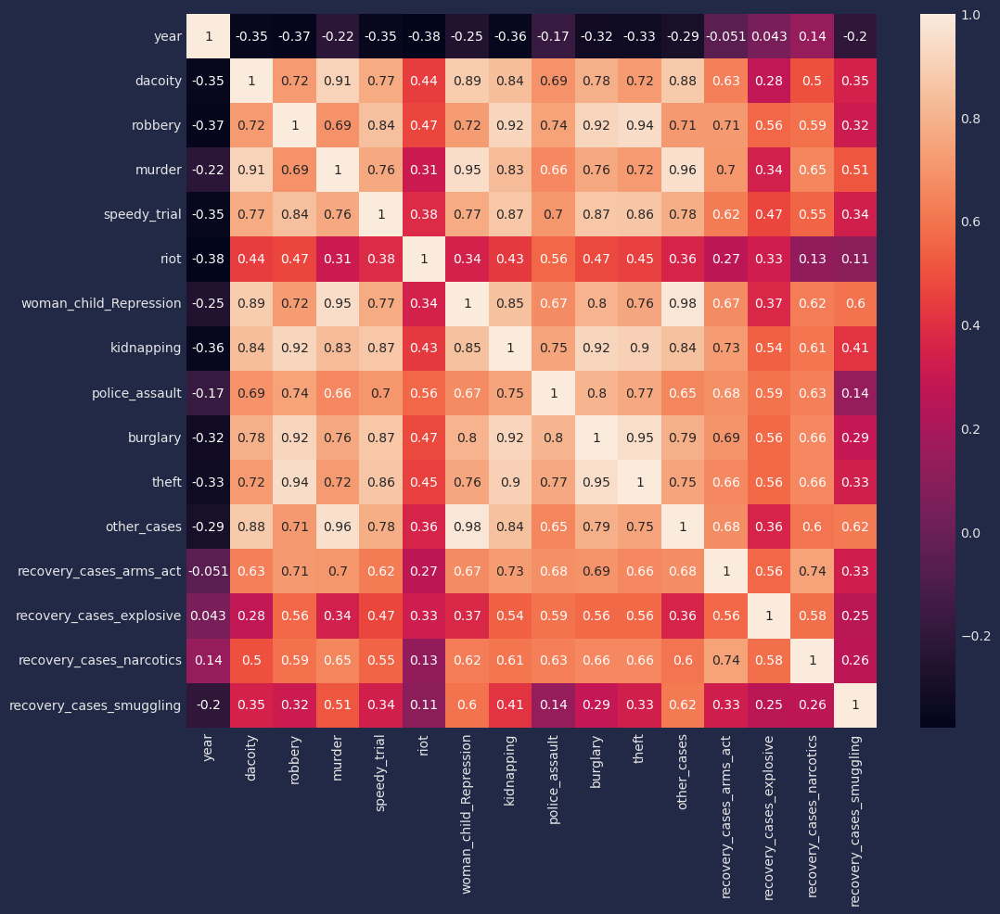

In [94]:
plt.figure(figsize=(12,10))
sns.heatmap(df.corr(), annot=True)
plt.show()

# Murder Prediction

In [95]:
df_copy = df.copy()
df_copy.dropna(inplace=True)
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
for i in df_copy.columns:
    if df_copy[i].dtype == 'object':
        df_copy[i] = le.fit_transform(df_copy[i])

In [96]:
X = df_copy.drop('murder',axis=1)
y = df_copy['murder']

In [97]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2, random_state=42)
X_train.shape,y_train.shape,X_test.shape,y_test.shape

((116, 16), (116,), (30, 16), (30,))

In [98]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

X_train=scaler.fit_transform(X_train)
X_test=scaler.fit_transform(X_test)
X_train=pd.DataFrame(X_train)
X_test=pd.DataFrame(X_test) 
X_train.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15
0,0.0625,0.000000,0.048780,0.040816,0.037300,0.000000,0.021896,0.029412,0.023810,0.034985,0.036193,0.024442,0.029260,0.000000,0.004903,0.051406
1,0.3125,0.222222,0.402439,0.755102,0.689165,0.196429,0.320039,0.730392,0.404762,0.862974,1.000000,0.369625,0.488812,0.242894,0.366684,0.043497
2,0.0000,0.888889,0.121951,0.081633,0.097691,0.000000,0.258260,0.098039,0.059524,0.192420,0.090706,0.221499,0.092943,0.144703,0.191713,0.000879
3,0.8750,0.888889,0.006098,0.003401,0.003552,0.000000,0.003715,0.039216,0.005952,0.004373,0.006702,0.003613,0.003442,0.002584,0.007024,0.000000
4,0.7500,0.111111,0.012195,0.047619,0.005329,0.053571,0.028543,0.078431,0.032738,0.080175,0.044236,0.029260,0.013769,0.002584,0.009232,0.087434


In [99]:
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor,ExtraTreesRegressor,GradientBoostingRegressor
from xgboost import XGBRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import r2_score,mean_absolute_error,mean_squared_error

In [100]:
res = pd.DataFrame()

lr = LinearRegression()
tree = DecisionTreeRegressor()
rf = RandomForestRegressor()
etree = ExtraTreesRegressor()
gb = GradientBoostingRegressor()
xgb = XGBRegressor()
knn = KNeighborsRegressor()

Models = [lr,tree,rf,etree,gb,xgb,knn]

for model in Models:
    print('Model is: {}'.format(model))
    m = model.fit(X_train,y_train)
    print('Training score : {}'.format(m.score(X_train,y_train)))
    prediction = m.predict(X_test)
    print('Predictions are : {}'.format(prediction))
    
    r2score = r2_score(y_test,prediction)
    print('R2 score is : {}'.format(r2score))
    mae = mean_absolute_error(y_test,prediction)
    mse = mean_squared_error(y_test,prediction)
    rmse = np.sqrt(mean_squared_error(y_test,prediction))
    print('MAE : {}'.format(mae))
    print('MSE : {}'.format(mse))
    print('RMSE : {}'.format(rmse))

    model_dict = {'Model Name' : model, 'R2 score':r2score,'MAE' : mae,'MSE' : mse,'RMSE' : rmse}
    res = res.append(model_dict,ignore_index=True)
    print(res)
    print('='*80)

Model is: LinearRegression()
Training score : 0.9726470582853799
Predictions are : [  69.85075607  303.43459898    9.06195807  956.85730928   26.21070689
  728.80793528  -14.54505498  373.19403394  394.83855742   43.98440071
  -48.67080066   68.79505438   50.79997535  331.00718521   42.29978487
  349.41409819 1400.75307197   32.90146254   -6.38587145   13.83445754
   -1.66232117  517.40040615  653.14048475  -12.91953033   20.72622648
  301.46089401  340.2184671     3.07002826   31.41100573  423.82145796]
R2 score is : 0.934419704888882
MAE : 65.42100474832407
MSE : 7833.119212011366
RMSE : 88.50491066608319
           Model Name  R2 score        MAE          MSE       RMSE
0  LinearRegression()   0.93442  65.421005  7833.119212  88.504911
Model is: DecisionTreeRegressor()
Training score : 1.0
Predictions are : [  15.  216.   94. 1153.   23.  662.   18.  464.  464.   33.   19.   25.
    9.  169.   33.  194. 1153.    9.   17.  105.    9.  408. 1303.   24.
   32.  169.  194.    9.   15.  

In [101]:
models = ['LinearRegression','DecisionTreeRegressor','RandomForestRegressor','ExtraTreesRegressor','GradientBoostingRegressor','XGBRegressor','KNeighborsRegressor']

result = pd.DataFrame({'Models':models})
result['R2 score'] = res['R2 score']
result['MAE'] = res['MAE']
result['MSE'] = res['MSE']
result['RMSE'] = res['RMSE']
result = result.sort_values(by='R2 score',ascending=False)
result

,Models,R2 score,MAE,MSE,RMSE
3,ExtraTreesRegressor,0.981765,29.262333,2177.994110,46.668984
5,XGBRegressor,0.962195,38.658283,4515.533468,67.197719
2,RandomForestRegressor,0.958089,42.452000,5005.970580,70.752884
6,KNeighborsRegressor,0.949213,43.020000,6066.161333,77.885566
4,GradientBoostingRegressor,0.948707,41.686290,6126.594741,78.272567
0,LinearRegression,0.934420,65.421005,7833.119212,88.504911
1,DecisionTreeRegressor,0.888060,48.433333,13370.433333,115.630590


In [102]:
etree.fit(X_train,y_train)
y_pred = etree.predict(X_test)

out = pd.DataFrame({'murder_actual':y_test,'murder_pred':y_pred})
result = df_copy.merge(out,left_index=True,right_index=True)
result.head(10)

,area_name,year,dacoity,robbery,murder,speedy_trial,riot,woman_child_Repression,kidnapping,police_assault,burglary,theft,other_cases,recovery_cases_arms_act,recovery_cases_explosive,recovery_cases_narcotics,recovery_cases_smuggling,murder_actual,murder_pred
9,7,2010,74,125,513,110,15,2275,156,25,332,947,9954,211,96,2292,1238,513,476.47
11,11,2010,54,130,757,276,29,4095,105,35,442,1442,20654,134,10,3614,2509,757,894.93
12,10,2010,0,1,33,3,1,5,5,1,2,104,142,1,0,176,165,33,19.22
18,16,2011,9,24,37,42,1,158,16,16,31,129,857,8,0,178,32,37,33.04
19,4,2011,160,174,1199,361,17,4838,144,117,607,1731,19993,260,25,7497,1076,1199,1249.03
27,3,2012,10,66,88,74,18,281,27,26,112,283,1492,121,5,1976,41,88,90.02
29,12,2012,2,24,37,9,6,122,11,15,52,136,728,5,3,229,130,37,23.30
30,1,2012,8,9,20,7,0,135,5,11,40,75,600,16,0,459,49,20,17.57
31,16,2012,8,15,37,52,3,140,6,28,42,116,784,11,1,186,4,37,32.74
36,0,2012,34,61,170,232,1,1168,55,13,186,277,6879,44,11,444,56,170,213.03


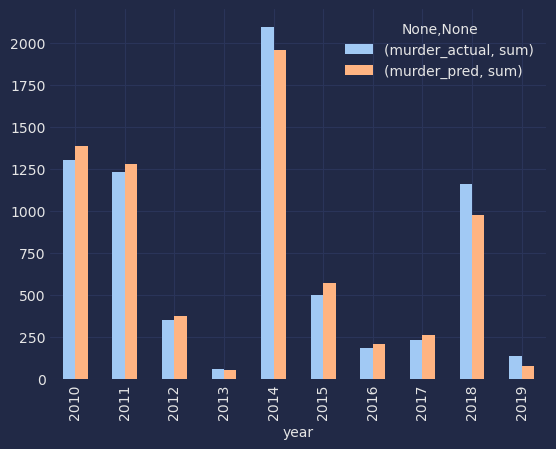

In [103]:
result.groupby('year')[['murder_actual','murder_pred']].agg(['sum']).plot(kind='bar')
plt.show()

# XGBRegressor robbery

In [104]:
df.drop(columns = ['area_name'], inplace = True)

In [105]:
from sklearn.preprocessing import StandardScaler

In [106]:
X = df.drop(columns = ['robbery'])
y = df['robbery']

In [107]:
sc = StandardScaler()
X = sc.fit_transform(X)

In [108]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)

In [109]:
xg = XGBRegressor()

In [110]:
xg.fit(X_train, y_train)

XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
             importance_type=None, interaction_constraints='',
             learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
             max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
             missing=nan, monotone_constraints='()', n_estimators=100, n_jobs=0,
             num_parallel_tree=1, predictor='auto', random_state=0, reg_alpha=0,
             reg_lambda=1, ...)

In [111]:
y_pred_xg = xg.predict(X_test)

In [112]:
train_accuracy_xg = xg.score(X_train,y_train)
test_accuracy_xg = xg.score(X_test, y_test)

In [113]:
print('actual:', train_accuracy_xg)
print('pred:', test_accuracy_xg)

actual: 0.9999999997998447
pred: 0.9346586227160291


# Hi, thank you so much for reading to the end, i just recently started doing analytics and your advice and comments are important to me. Don't forget to upvote this notebook if you like it!